# Exploratory Data Analysis (EDA)

## Table of Contents
1. [Dataset Overview](#dataset-overview)
2. [Handling Missing Values](#handling-missing-values)
3. [Feature Distributions](#feature-distributions)
4. [Possible Biases](#possible-biases)
5. [Correlations](#correlations)


. [Correlations](#correlations)


In [1]:
# Import necessary libraries
import sys
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
import importlib.util as ilu
import matplotlib.pyplot as plt
# plot autocorrelation
from pandas.plotting import autocorrelation_plot

# in jupyter (lab / notebook), based on notebook path
module_path = str(Path.cwd().parents[0])
# in standard python
#module_path = str(Path.cwd(__file__).parents[0] / "py")
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils import read_data as rd

d:\Miniconda3\envs\welokaTorch\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Dataset Overview

[Provide a high-level overview of the dataset. This should include the source of the dataset, the number of samples, the number of features, and example showing the structure of the dataset.]


In [ ]:
# utility function to print out the overview of the dataframe

def df_overview(df):
    """Prints out a brief overview of the dataframe"""
    # Number of samples
    num_samples = df.shape[0]

    # Number of features
    num_features = df.shape[1]

    print()
    # Display these dataset characteristics
    print(f"Number of samples: {num_samples}")
    print(f"Number of features: {num_features}")

    # Display the first few rows of the dataframe to show the structure
    print()
    print("Example data:")
    print(df.head())
    print()
    
    
    #return groups_count_number_dict

In [3]:
# read the data
weather_df, sales_df, product_group_dict = rd.read_data()

### Weather data

In [12]:
# Load the data
# Replace 'your_dataset.csv' with the path to your actual dataset
print(f"Weather dataset characteristics:")

df_overview(weather_df)

print("Descriptive Statistics:")
weather_df.describe(include='all')


Weather dataset characteristics:

Number of samples: 1810
Number of features: 5

Example data:
        Date nnav   ttav  ffav  wwav
0 2015-01-01  8.0  4.125    13  10.0
1 2015-01-02  6.0  7.750    24  61.0
2 2015-01-03  7.0  4.875    25  69.0
3 2015-01-04  0.0  4.750    15   NaN
4 2015-01-05  8.0  5.875     8  20.0

Descriptive Statistics:


,Date,nnav,ttav,ffav,wwav
count,1810,1800.0,1810.000000,1810.000000,1460.0
unique,NaN,9.0,NaN,NaN,24.0
top,NaN,7.0,NaN,NaN,61.0
freq,NaN,585.0,NaN,NaN,503.0
mean,2017-06-28 03:50:43.093922560,NaN,11.885716,11.098895,NaN
min,2015-01-01 00:00:00,NaN,-6.137500,3.000000,NaN
25%,2016-03-28 06:00:00,NaN,6.125000,8.000000,NaN
50%,2017-06-24 12:00:00,NaN,11.375000,10.000000,NaN
75%,2018-09-29 18:00:00,NaN,17.725000,14.000000,NaN
max,2019-12-31 00:00:00,NaN,32.671428,35.000000,NaN


### Sales Data

In [13]:

# Display these dataset characteristics
print(f"Sales dataset characteristics:")

df_overview(sales_df)

print("Descriptive Statistics:")
sales_df.describe(include='all')

Sales dataset characteristics:

Number of samples: 62190
Number of features: 4

Example data:
      Filiale       Date Product Group       Sales
35805       2 2015-01-02            12   36.972801
43115       3 2015-01-02             2   60.101109
14842       1 2015-01-02            11  266.254971
53950       3 2015-01-02             9   89.217757
25261       2 2015-01-02             4   58.999279

Descriptive Statistics:


,Filiale,Date,Product Group,Sales
count,62190.0,62190,62190.0,62190.000000
unique,3.0,NaN,13.0,NaN
top,3.0,NaN,6.0,NaN
freq,21657.0,NaN,5516.0,NaN
mean,NaN,2017-09-02 15:08:05.209840896,NaN,135.624119
min,NaN,2015-01-02 00:00:00,NaN,-19.456941
25%,NaN,2016-05-04 00:00:00,NaN,69.405283
50%,NaN,2017-08-21 00:00:00,NaN,106.705812
75%,NaN,2018-12-31 00:00:00,NaN,161.285345
max,NaN,2020-05-27 00:00:00,NaN,3154.149267


### Product Group Dictionary

In [14]:
product_group_dict

{1: 'Weizenbrot',
 2: 'Mischbrot',
 3: 'Vollkornbrot',
 4: 'Spezialbrot',
 5: 'Stangenbrote',
 6: 'Brötchen',
 7: 'Süße Brötchen',
 8: 'Herzhafte Brötchen',
 9: 'KonditoreiBlech1',
 10: 'KonditoreiBlech2',
 11: 'Stückgebäck',
 12: 'Blechkuchen',
 13: 'Weihnachtsartikel'}

## Handling Missing Values

[Identify any missing values in the dataset, and describe your approach to handle them if there are any. If there are no missing values simply indicate that there are none.]


In [15]:
# delete all rows with NaN. We don't know how to handle them (Cloud cover and weather code) yet
weather_df = weather_df.dropna()
weather_df.describe(include='all')

,Date,nnav,ttav,ffav,wwav
count,1460,1460.0,1460.000000,1460.000000,1460.0
unique,NaN,9.0,NaN,NaN,24.0
top,NaN,7.0,NaN,NaN,61.0
freq,NaN,543.0,NaN,NaN,503.0
mean,2017-07-24 16:40:06.575342592,NaN,11.065122,11.260959,NaN
min,2015-01-01 00:00:00,NaN,-6.137500,3.000000,NaN
25%,2016-04-17 18:00:00,NaN,5.750000,8.000000,NaN
50%,2017-08-16 12:00:00,NaN,10.393750,11.000000,NaN
75%,2018-10-18 06:00:00,NaN,16.625000,14.000000,NaN
max,2019-12-27 00:00:00,NaN,28.875000,35.000000,NaN


## Feature Distributions

[Plot the distribution of various features and target variables. Comment on the skewness, outliers, or any other observations.]


### Merge weather and sales data

In [16]:
merged_df = pd.merge(weather_df, sales_df, on='Date', how='inner') # inner join uses only date that are present in both dataframes

# Display these dataset characteristics
print(f"Merged dataset characteristics:")

df_overview(merged_df)

print("Descriptive Statistics:")
merged_df.describe(include='all')

Merged dataset characteristics:

Number of samples: 46230
Number of features: 8

Example data:
        Date nnav  ttav  ffav  wwav Filiale Product Group       Sales
0 2015-01-02  6.0  7.75    24  61.0       2            12   36.972801
1 2015-01-02  6.0  7.75    24  61.0       3             2   60.101109
2 2015-01-02  6.0  7.75    24  61.0       1            11  266.254971
3 2015-01-02  6.0  7.75    24  61.0       3             9   89.217757
4 2015-01-02  6.0  7.75    24  61.0       2             4   58.999279

Descriptive Statistics:


,Date,nnav,ttav,ffav,wwav,Filiale,Product Group,Sales
count,46230,46230.0,46230.000000,46230.000000,46230.0,46230.0,46230.0,46230.000000
unique,NaN,9.0,NaN,NaN,24.0,3.0,13.0,NaN
top,NaN,7.0,NaN,NaN,61.0,3.0,6.0,NaN
freq,NaN,17263.0,NaN,NaN,15973.0,16061.0,4086.0,NaN
mean,2017-07-17 04:12:38.780012800,NaN,11.109389,11.227904,NaN,NaN,NaN,135.479674
min,2015-01-02 00:00:00,NaN,-6.137500,3.000000,NaN,NaN,NaN,-17.000714
25%,2016-04-16 00:00:00,NaN,5.750000,8.000000,NaN,NaN,NaN,69.601666
50%,2017-07-27 00:00:00,NaN,10.500000,10.000000,NaN,NaN,NaN,106.746118
75%,2018-10-05 00:00:00,NaN,16.650000,14.000000,NaN,NaN,NaN,161.376577
max,2019-12-27 00:00:00,NaN,28.875000,35.000000,NaN,NaN,NaN,3154.149267


### Handling Outliers

In [17]:
# delete all rows with negative sales
merged_df = merged_df[merged_df['Sales'] >= 0]

# Display these dataset characteristics
print(f"Merged dataset characteristics:")

df_overview(merged_df)

print("Descriptive Statistics:")
merged_df.describe(include='all')

Merged dataset characteristics:

Number of samples: 46106
Number of features: 8

Example data:
        Date nnav  ttav  ffav  wwav Filiale Product Group       Sales
0 2015-01-02  6.0  7.75    24  61.0       2            12   36.972801
1 2015-01-02  6.0  7.75    24  61.0       3             2   60.101109
2 2015-01-02  6.0  7.75    24  61.0       1            11  266.254971
3 2015-01-02  6.0  7.75    24  61.0       3             9   89.217757
4 2015-01-02  6.0  7.75    24  61.0       2             4   58.999279

Descriptive Statistics:


,Date,nnav,ttav,ffav,wwav,Filiale,Product Group,Sales
count,46106,46106.0,46106.000000,46106.000000,46106.0,46106.0,46106.0,46106.000000
unique,NaN,9.0,NaN,NaN,24.0,3.0,13.0,NaN
top,NaN,7.0,NaN,NaN,61.0,3.0,6.0,NaN
freq,NaN,17207.0,NaN,NaN,15930.0,16022.0,4086.0,NaN
mean,2017-07-17 02:16:23.507569664,NaN,11.113556,11.228235,NaN,NaN,NaN,135.857364
min,2015-01-02 00:00:00,NaN,-6.137500,3.000000,NaN,NaN,NaN,0.076475
25%,2016-04-16 00:00:00,NaN,5.750000,8.000000,NaN,NaN,NaN,69.844342
50%,2017-07-27 00:00:00,NaN,10.500000,10.000000,NaN,NaN,NaN,106.988611
75%,2018-10-05 00:00:00,NaN,16.650000,14.000000,NaN,NaN,NaN,161.536188
max,2019-12-27 00:00:00,NaN,28.875000,35.000000,NaN,NaN,NaN,3154.149267


### Data visualization

In [66]:
# utility function to plot the sales for each product group

def group_plot_df(df, groupby, title, label_dict, colors_list, title_sufix_dict={}):
    """Plot a grouped dataframe"""
    
    # Group the dataframe
    grouped_df = df.groupby(groupby)
    
    groups_count_number_dict = {}
    
    # plot the sales for each product group
    for name, group in grouped_df:
        group.sort_index(inplace=True)
        fig, ax = plt.subplots(len(label_dict.keys()), 1, figsize=(20,15), sharex=True)
        name = title_sufix_dict.get(name, name)
        fig.suptitle(f"{title} - {name}", fontsize=16)
        for i, label in enumerate(label_dict.keys()):
            # check if the label is categorical
            if pd.api.types.is_categorical_dtype(group[label]):
                # TODO: plot the categorical data
                pass
            else:
                group.plot.line(ax=ax[i], color=colors_list[i], y=label, label=label_dict[label])
                #ax[i].fill_between(group.index,0, group[label], color=colors_list[i])
        
            for s in ['top', 'right']:
                try:
                    ax[i].spines[s].set_visible(False)
                except:
                    pass
        groups_count_number_dict[name] = len(group)
        
        #autocorrelation_plot(group['Sales'], ax=ax[-1])
                
    plt.show()
    
    #bar plot of the number of samples in each group with value counts
    fig, ax = plt.subplots(figsize=(20,5))
    fig.suptitle(f"{title} - Number of samples in each group", fontsize=16)
    bars = ax.bar(groups_count_number_dict.keys(), groups_count_number_dict.values(), color=colors_list[-1])
    ax.xaxis.set_tick_params(rotation=90 )
    ax.bar_label(bars)
    for s in ['top', 'right']:
        ax.spines[s].set_visible(False)
    plt.show()

In [73]:
colors_list = ['red', 'blue', 'green', 'gray', 'orange', 'purple', 'magenta', 'pink', 'olive', 'cyan', 'brown',
               'black', 'lime', 'teal', 'coral', 'gold', 'navy', 'tan', 'salmon', 'darkgreen', 'darkred', 'darkblue',
               'darkgray', 'darkorange', 'darkcyan', 'darkmagenta', 'darkkhaki', 'darkolivegreen', 'darkgoldenrod',
               'darkslategray', 'darkslateblue', 'darkseagreen', 'darkviolet', 'darkturquoise', 'darkorchid', 'darkslateblue',
               'darkslategray', 'darkslategrey', 'darkkhaki', 'darkolivegreen', 'darkgoldenrod', 'darkgoldenro']
label_dict = {
    'Sales': 'Sales',
    'ttav': 'Temperature',
    'ffav': 'Wind Speed',
    #'nnav': 'Cloud Cover', # TODO: plot categorical data
    #'wwav': 'Weather Code'
}


#### Filiale 1

In [56]:
# split the data by filiale and drop the filiale column, because it is the same for all rows
filiale_1_df = merged_df.loc[merged_df['Filiale'] == 1]
filiale_1_df = filiale_1_df.drop(columns=['Filiale'])
filiale_1_df.set_index("Date", inplace=True, drop=True) # set the date as 

# Display these dataset characteristics
print(f"Filiale 1 dataset characteristics:")

df_overview(filiale_1_df)

print("Descriptive Statistics:")
filiale_1_df.describe(include='all')

Filiale 1 dataset characteristics:

Number of samples: 14230
Number of features: 6

Example data:
           nnav  ttav  ffav  wwav Product Group       Sales
Date                                                       
2015-01-02  6.0  7.75    24  61.0            11  266.254971
2015-01-02  6.0  7.75    24  61.0             4  118.786757
2015-01-02  6.0  7.75    24  61.0             8  163.713061
2015-01-02  6.0  7.75    24  61.0            12   93.169864
2015-01-02  6.0  7.75    24  61.0             7  181.329660

Descriptive Statistics:


,nnav,ttav,ffav,wwav,Product Group,Sales
count,14230.0,14230.000000,14230.000000,14230.0,14230.0,14230.000000
unique,9.0,NaN,NaN,23.0,13.0,NaN
top,7.0,NaN,NaN,61.0,6.0,NaN
freq,5276.0,NaN,NaN,4868.0,1236.0,NaN
mean,NaN,11.253894,11.250949,NaN,NaN,127.120300
std,NaN,6.859823,4.284779,NaN,NaN,69.550745
min,NaN,-6.137500,3.000000,NaN,NaN,0.076475
25%,NaN,5.875000,8.000000,NaN,NaN,76.874573
50%,NaN,10.650000,11.000000,NaN,NaN,124.468759
75%,NaN,16.937500,14.000000,NaN,NaN,165.274479


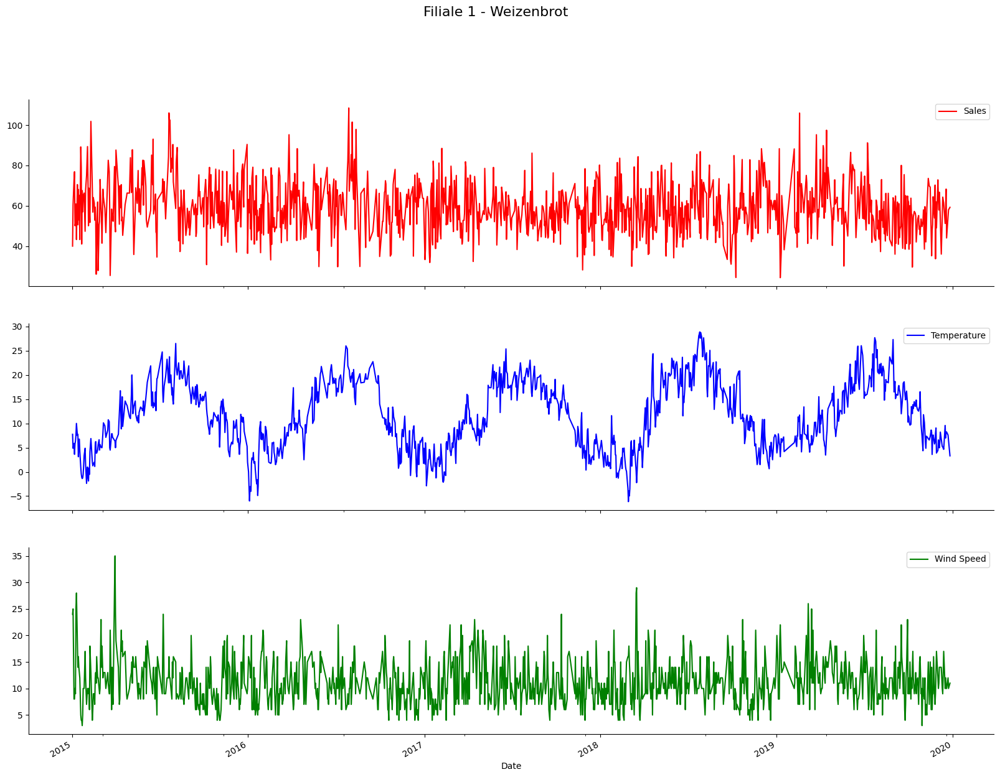

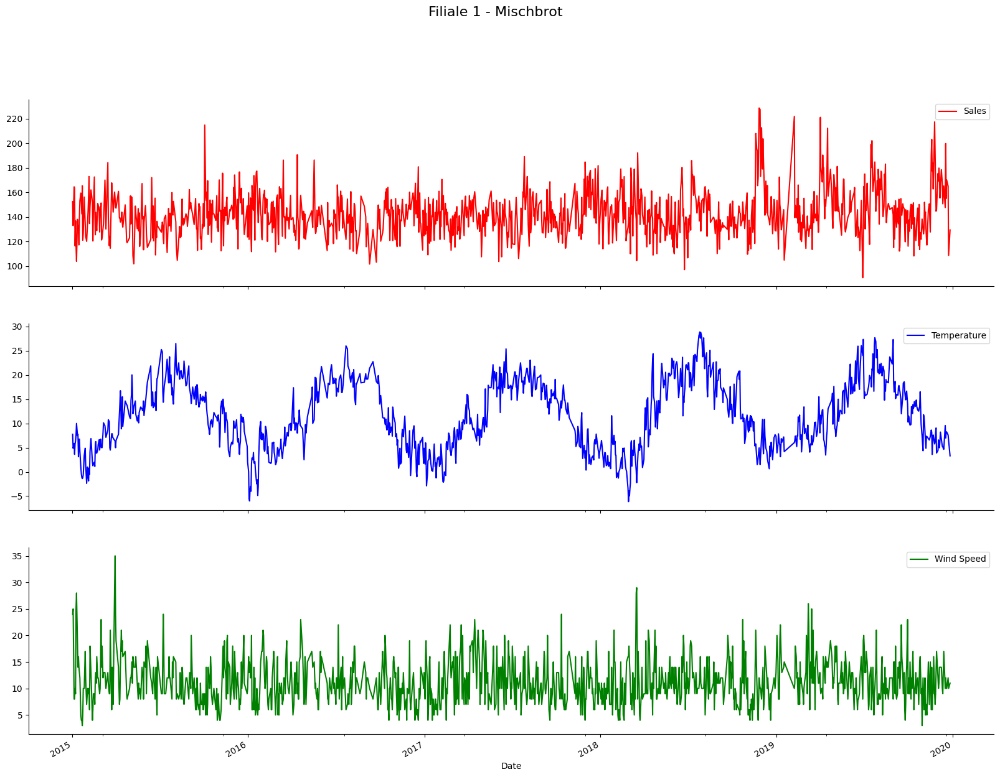

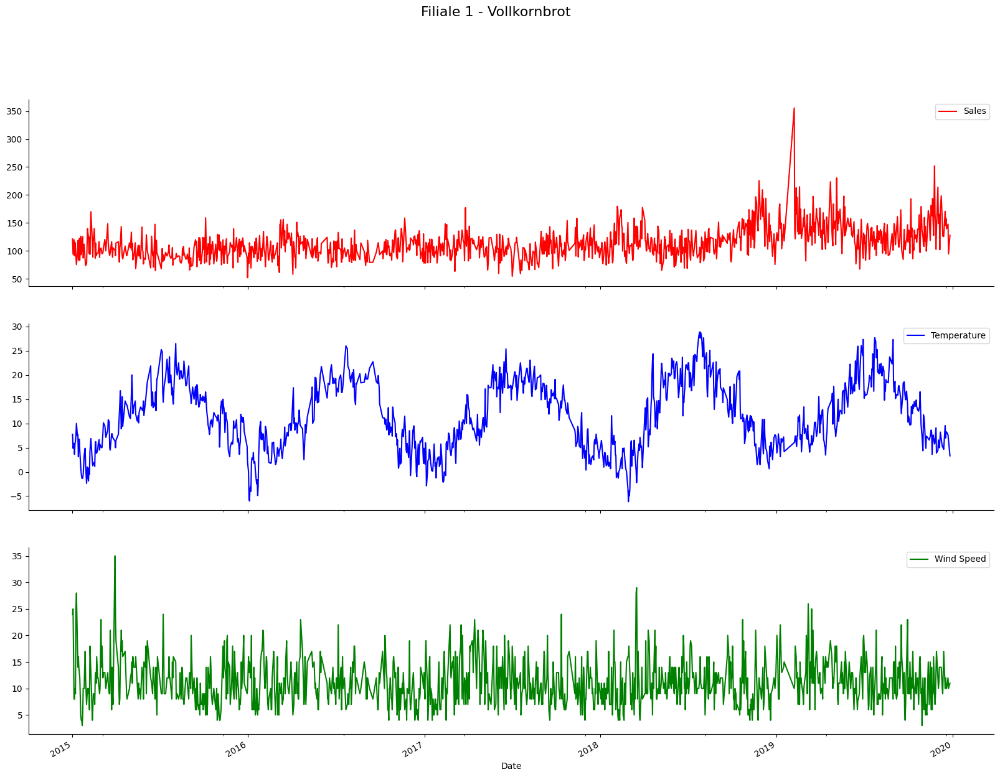

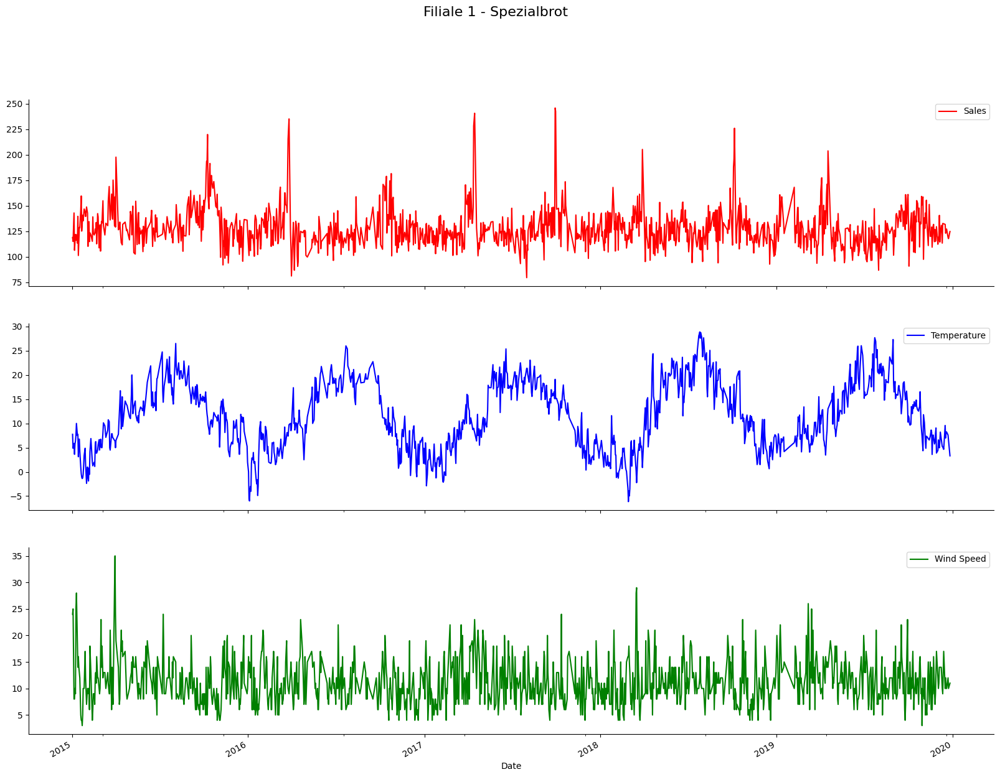

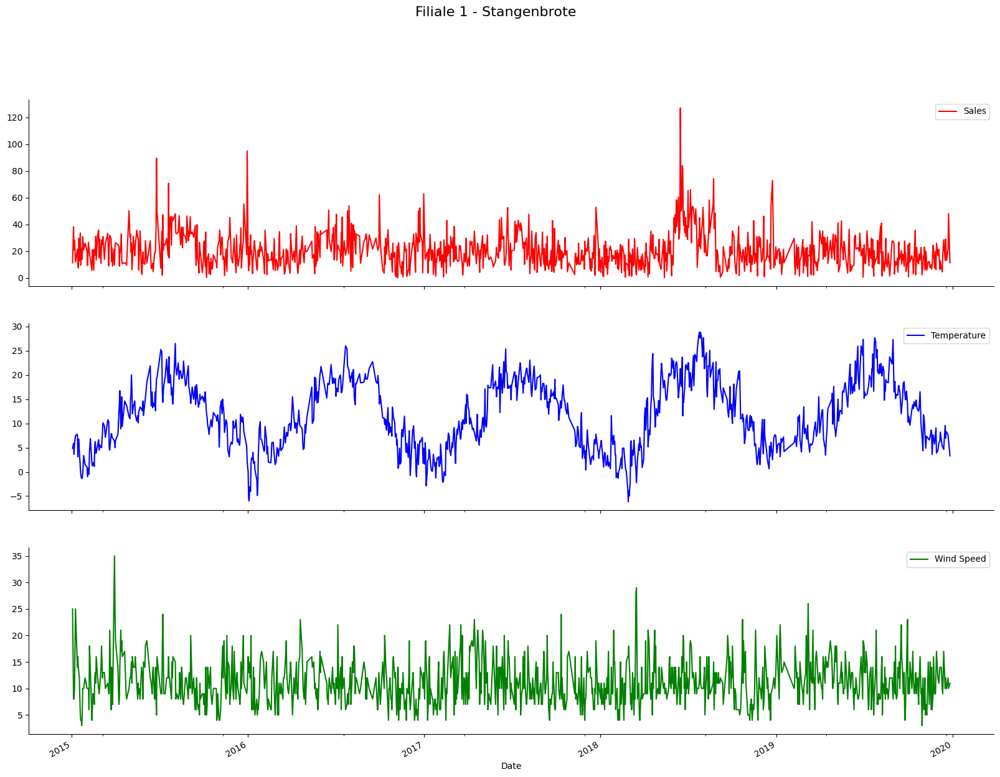

...

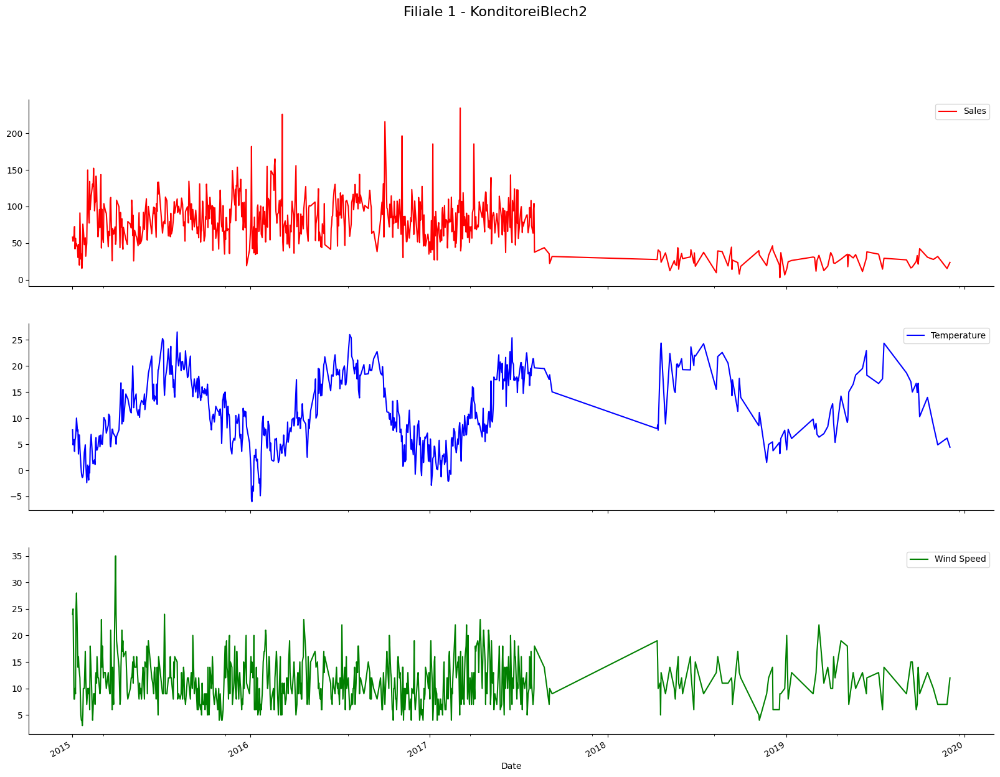

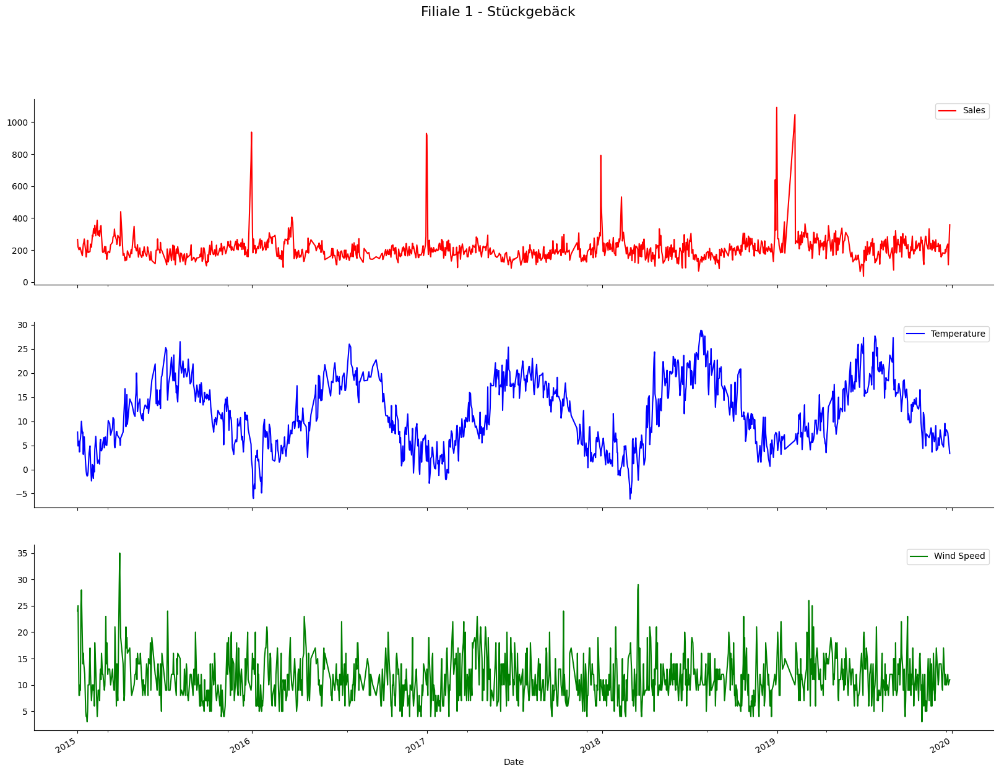

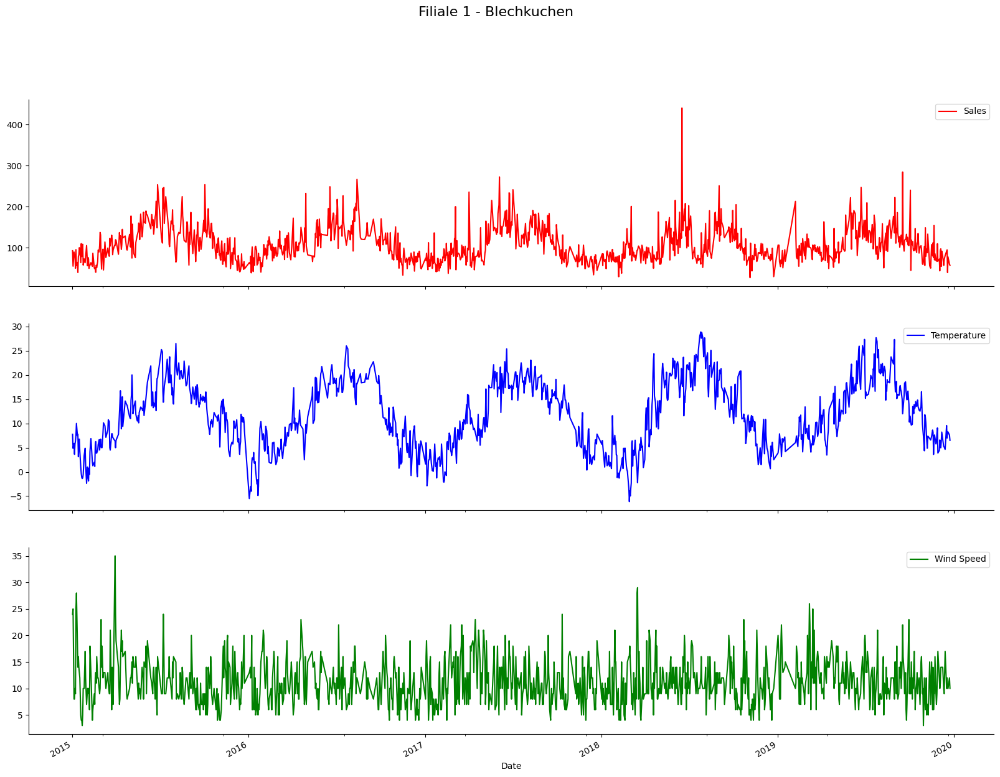

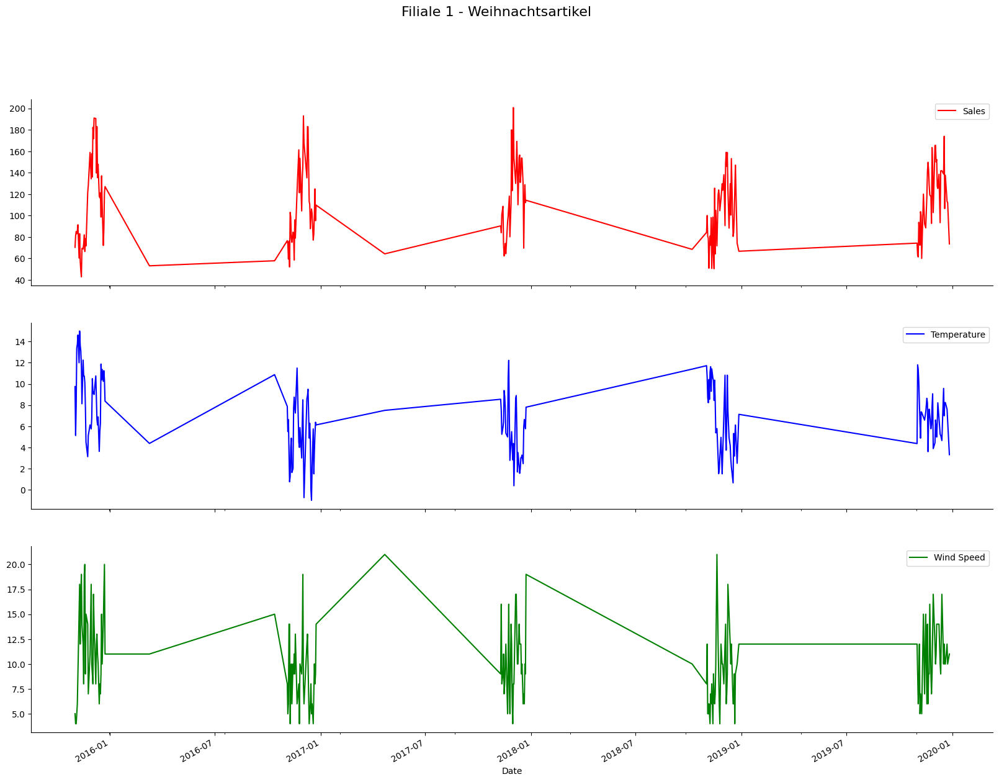

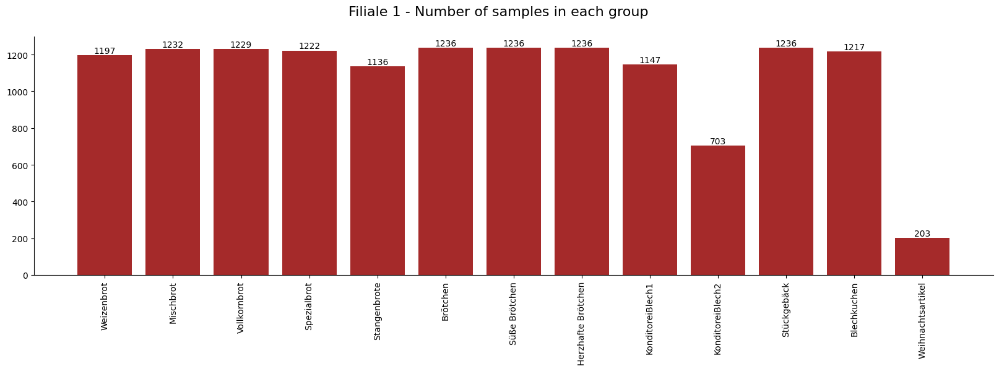

In [57]:
# plot the sales for each product group
group_plot_df(filiale_1_df, 'Product Group', 'Filiale 1', label_dict, colors_list, product_group_dict)

#### Filiale 2

In [21]:
# split the data by filiale and drop the filiale column, because it is the same for all rows
filiale_2_df = merged_df.loc[merged_df['Filiale'] == 2]
filiale_2_df = filiale_2_df.drop(columns=['Filiale'])
filiale_2_df.set_index("Date", inplace=True, drop=True) # set the date as 

# Display these dataset characteristics
print(f"Filiale 2 dataset characteristics:")

df_overview(filiale_2_df)

print("Descriptive Statistics:")
filiale_2_df.describe(include='all')


Filiale 2 dataset characteristics:

Number of samples: 15854
Number of features: 6

Example data:
           nnav  ttav  ffav  wwav Product Group       Sales
Date                                                       
2015-01-02  6.0  7.75    24  61.0            12   36.972801
2015-01-02  6.0  7.75    24  61.0             4   58.999279
2015-01-02  6.0  7.75    24  61.0             2   84.633190
2015-01-02  6.0  7.75    24  61.0             3  115.157621
2015-01-02  6.0  7.75    24  61.0             8   87.759013

Descriptive Statistics:


,nnav,ttav,ffav,wwav,Product Group,Sales
count,15854.0,15854.000000,15854.000000,15854.0,15854.0,15854.000000
unique,9.0,NaN,NaN,24.0,13.0,NaN
top,7.0,NaN,NaN,61.0,2.0,NaN
freq,5926.0,NaN,NaN,5489.0,1427.0,NaN
mean,NaN,11.081536,11.227072,NaN,NaN,125.881383
std,NaN,6.864705,4.311709,NaN,NaN,105.014378
min,NaN,-6.137500,3.000000,NaN,NaN,0.830719
25%,NaN,5.750000,8.000000,NaN,NaN,64.819082
50%,NaN,10.462500,10.000000,NaN,NaN,90.676549
75%,NaN,16.650000,14.000000,NaN,NaN,150.909843


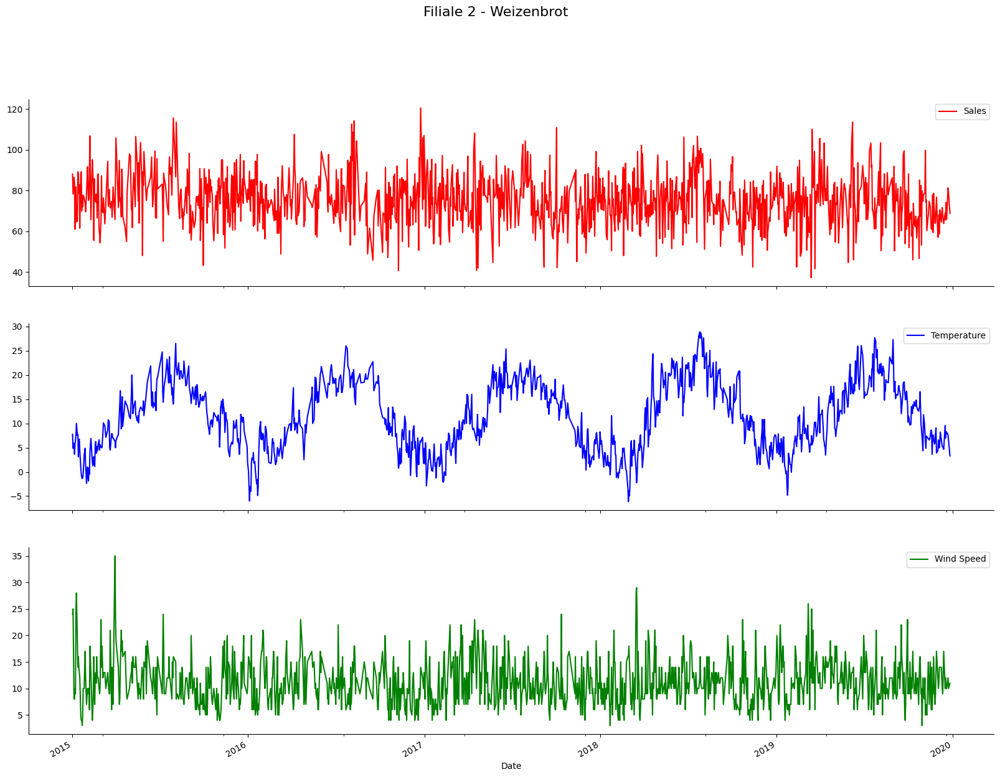

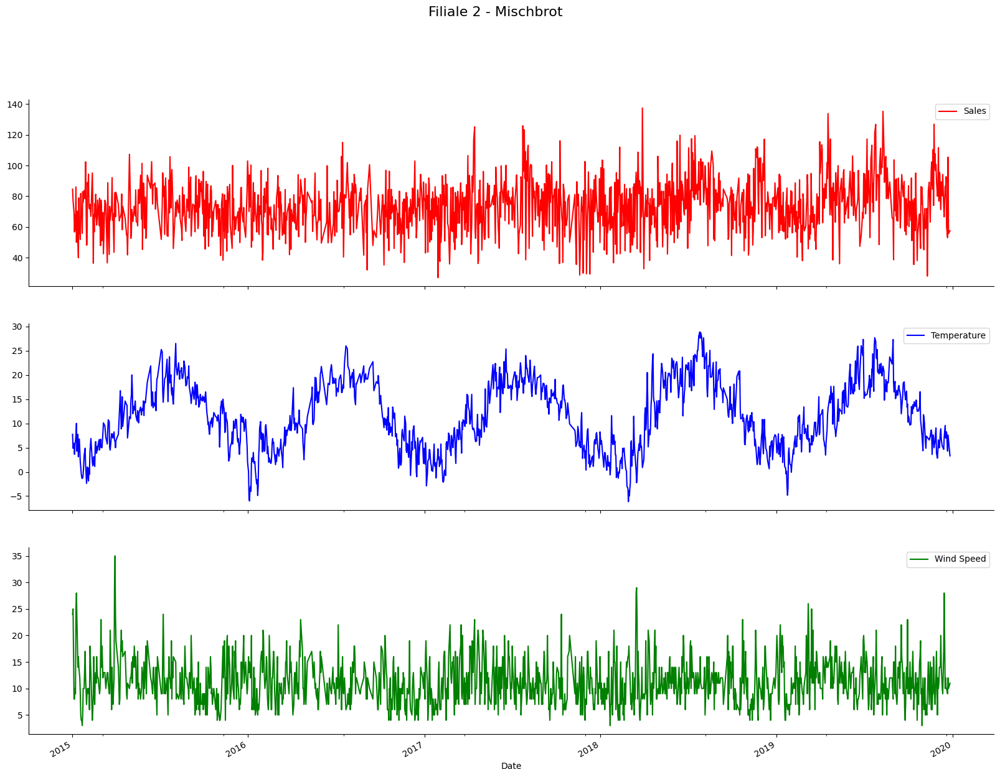

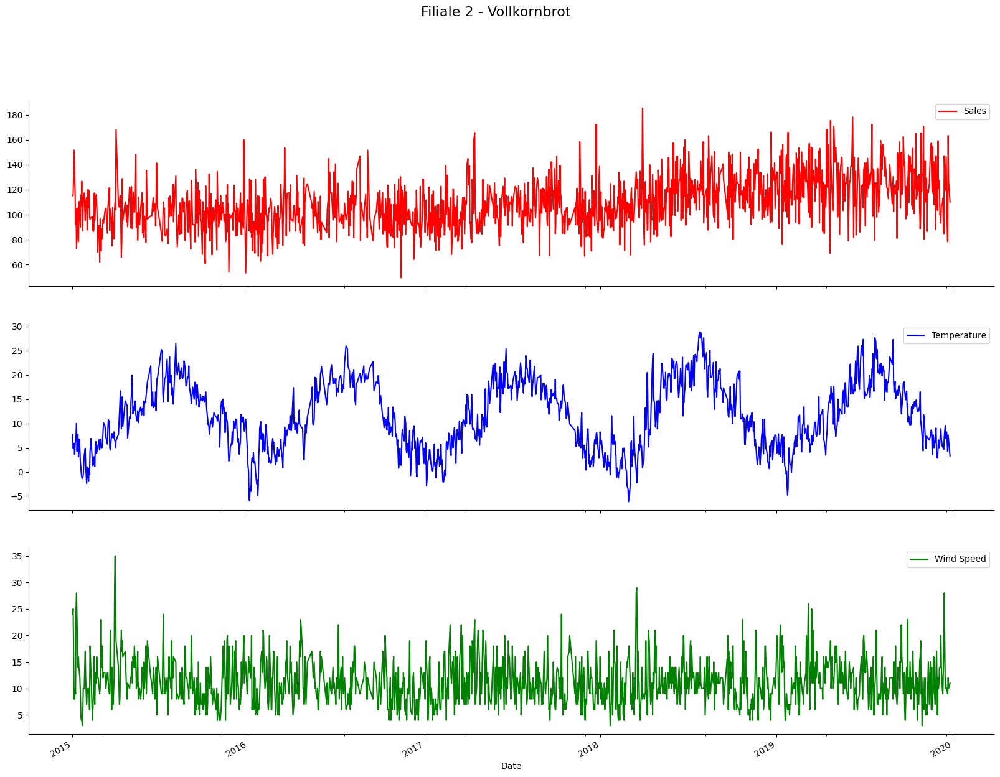

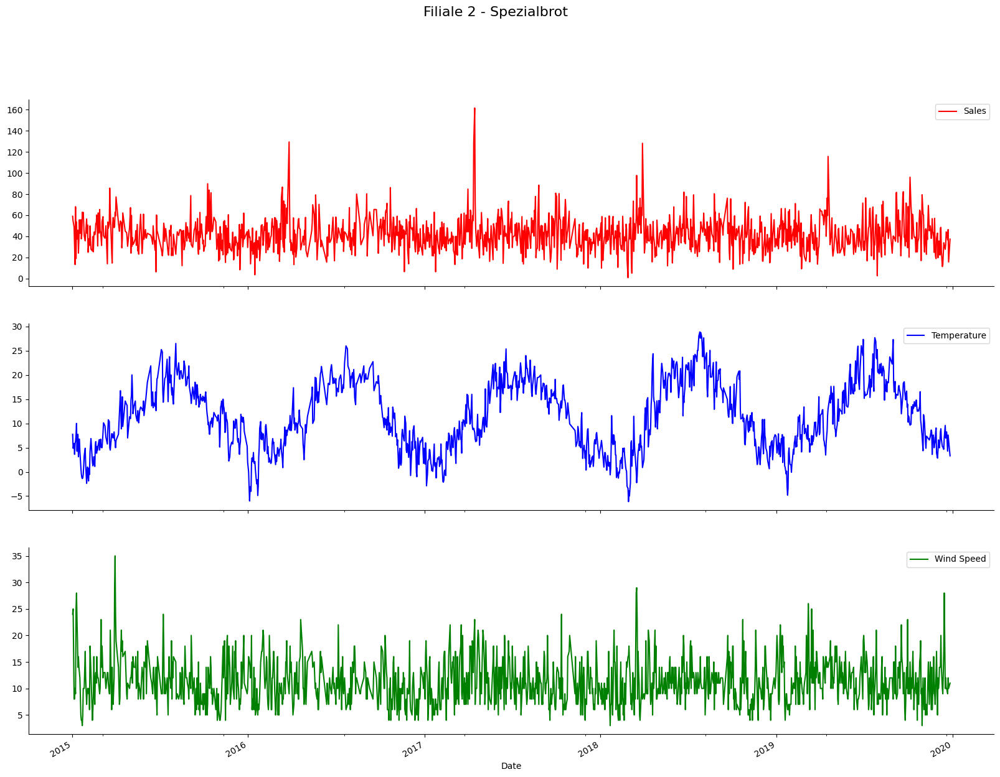

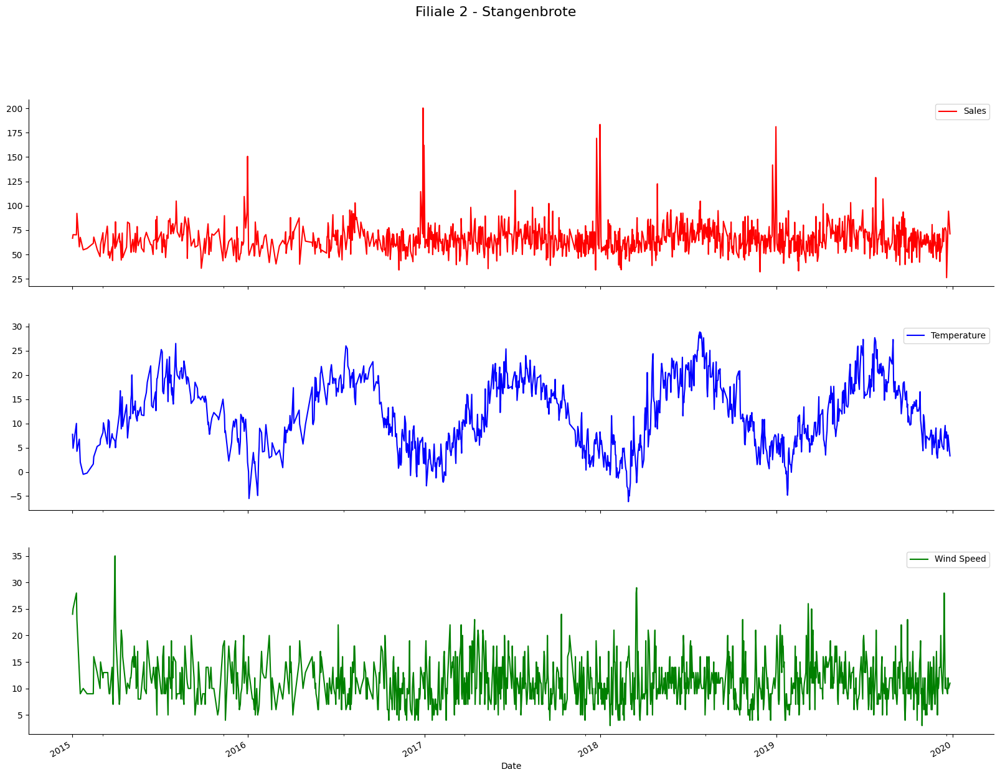

...

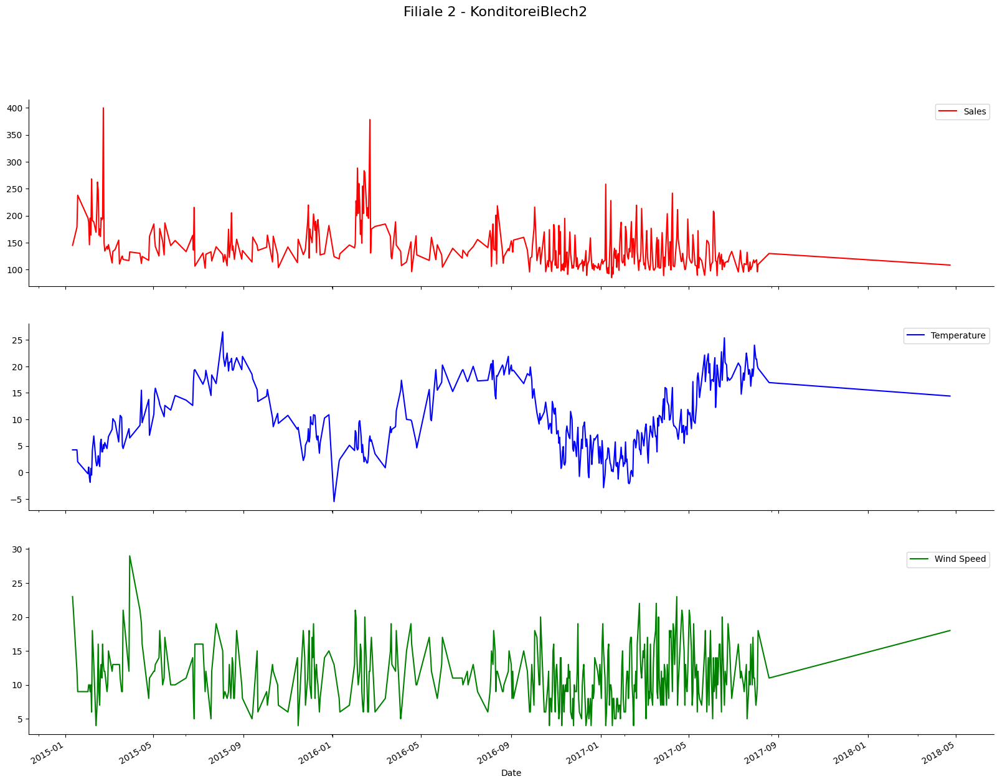

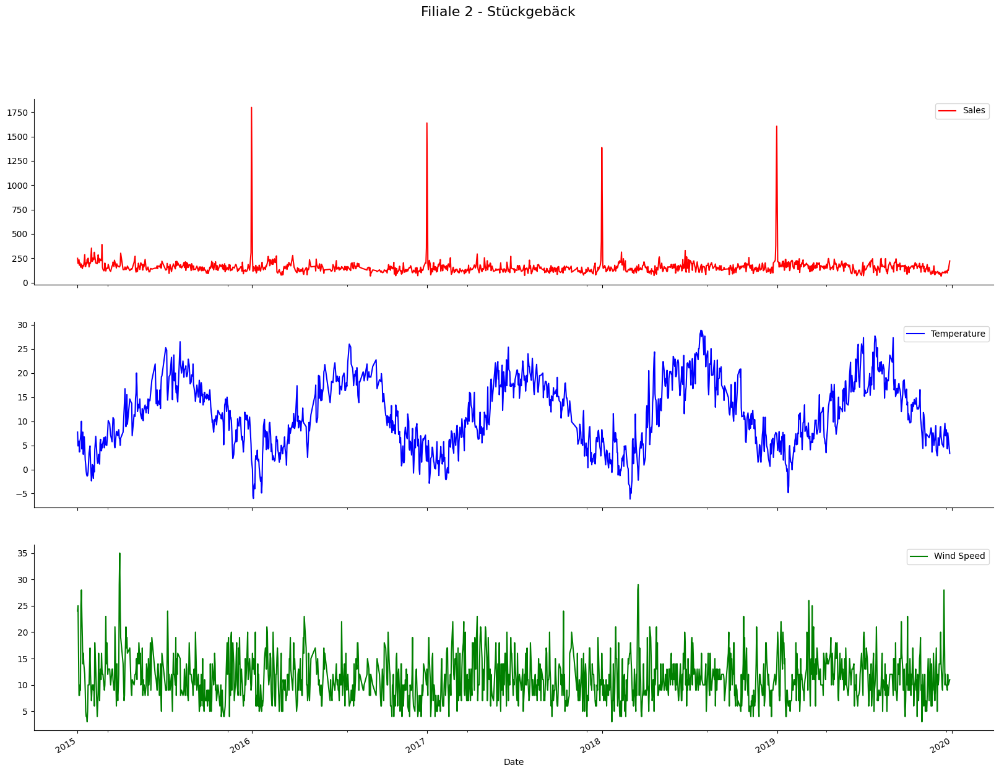

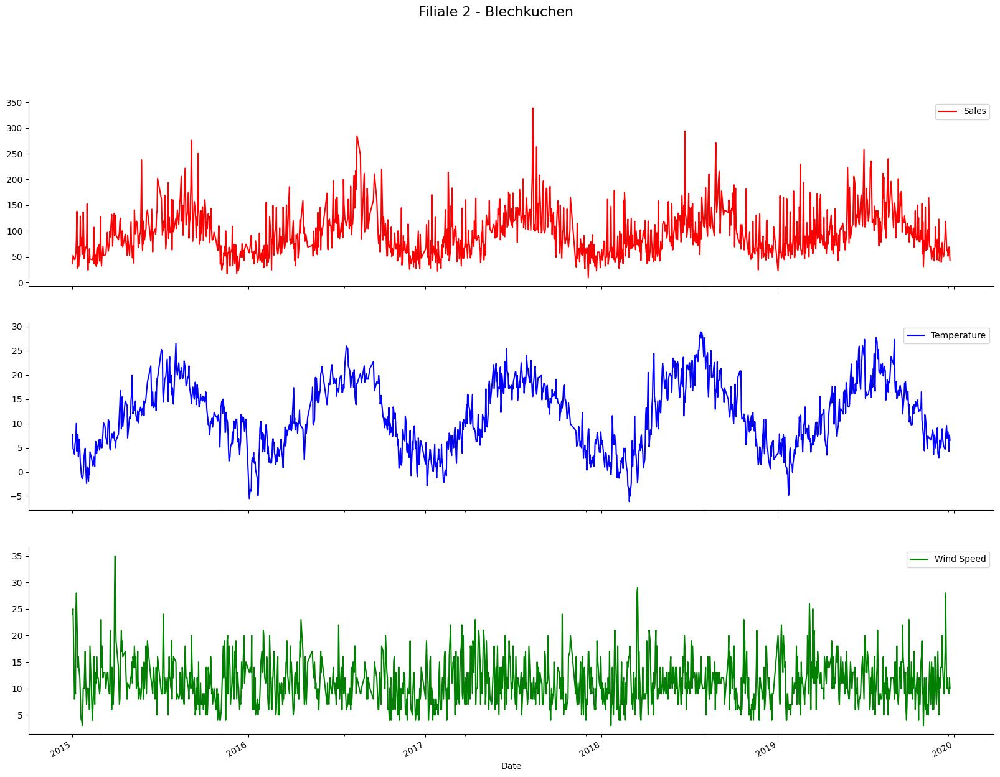

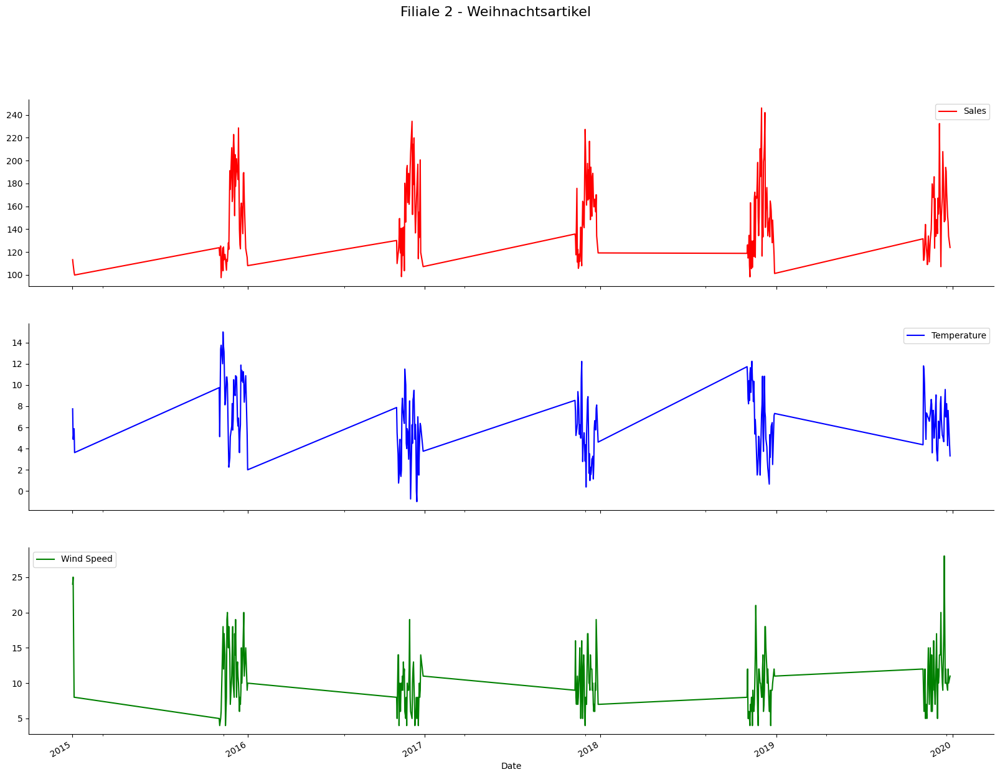

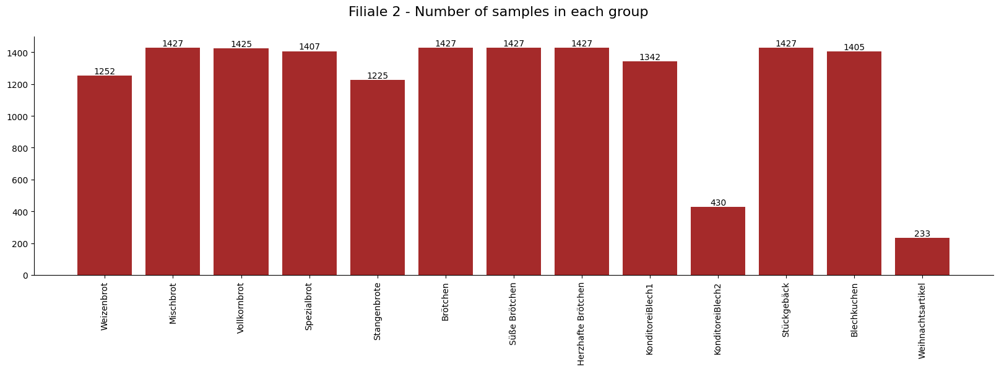

In [22]:
group_plot_df(filiale_2_df, 'Product Group', 'Filiale 2', label_dict, colors_list, product_group_dict)

#### Filiale 3

In [23]:
filiale_3_df = merged_df.loc[merged_df['Filiale'] == 3]
filiale_3_df = filiale_3_df.drop(columns=['Filiale'])
filiale_3_df.set_index("Date", inplace=True, drop=True) # set the date as

# Display these dataset characteristics
print(f"Filiale 3 dataset characteristics:")
df_overview(filiale_3_df)

print("Descriptive Statistics:")
filiale_3_df.describe(include='all')


Filiale 3 dataset characteristics:

Number of samples: 16022
Number of features: 6

Example data:
           nnav  ttav  ffav  wwav Product Group       Sales
Date                                                       
2015-01-02  6.0  7.75    24  61.0             2   60.101109
2015-01-02  6.0  7.75    24  61.0             9   89.217757
2015-01-02  6.0  7.75    24  61.0             7   92.229463
2015-01-02  6.0  7.75    24  61.0             4   94.693503
2015-01-02  6.0  7.75    24  61.0             6  417.486331

Descriptive Statistics:


,nnav,ttav,ffav,wwav,Product Group,Sales
count,16022.0,16022.000000,16022.000000,16022.0,16022.0,16022.000000
unique,9.0,NaN,NaN,24.0,13.0,NaN
top,7.0,NaN,NaN,61.0,6.0,NaN
freq,6005.0,NaN,NaN,5573.0,1423.0,NaN
mean,NaN,11.020600,11.209212,NaN,NaN,153.488599
std,NaN,6.846823,4.311340,NaN,NaN,162.576593
min,NaN,-6.137500,3.000000,NaN,NaN,0.341387
25%,NaN,5.750000,8.000000,NaN,NaN,73.595524
50%,NaN,10.375000,10.000000,NaN,NaN,106.531862
75%,NaN,16.587500,14.000000,NaN,NaN,169.704711


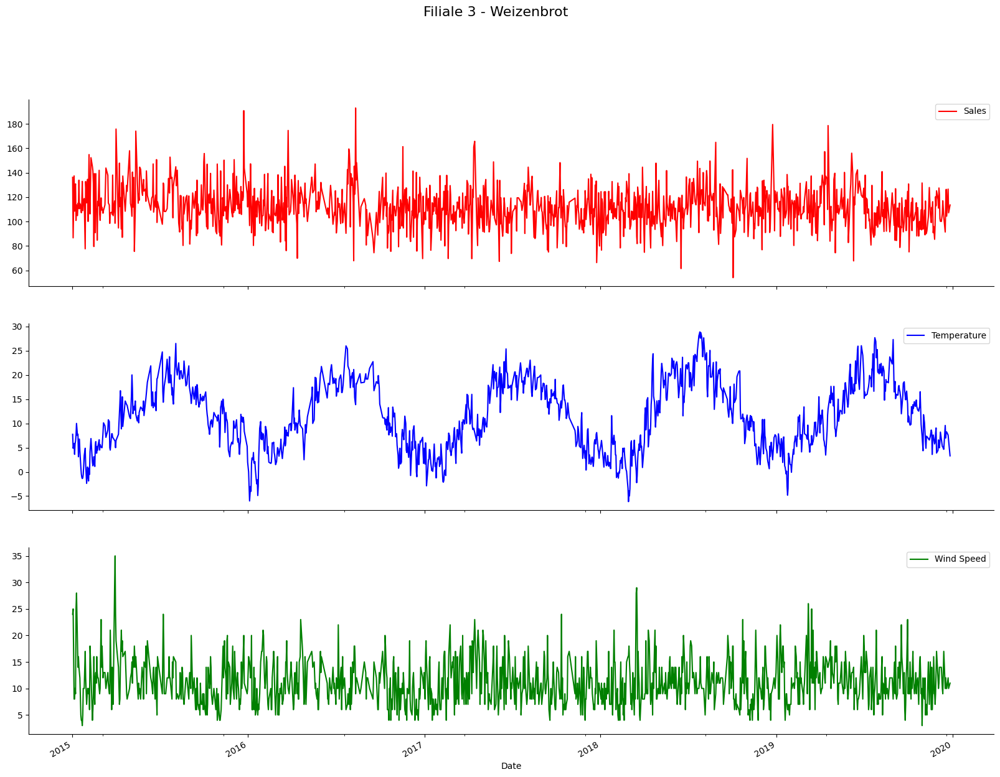

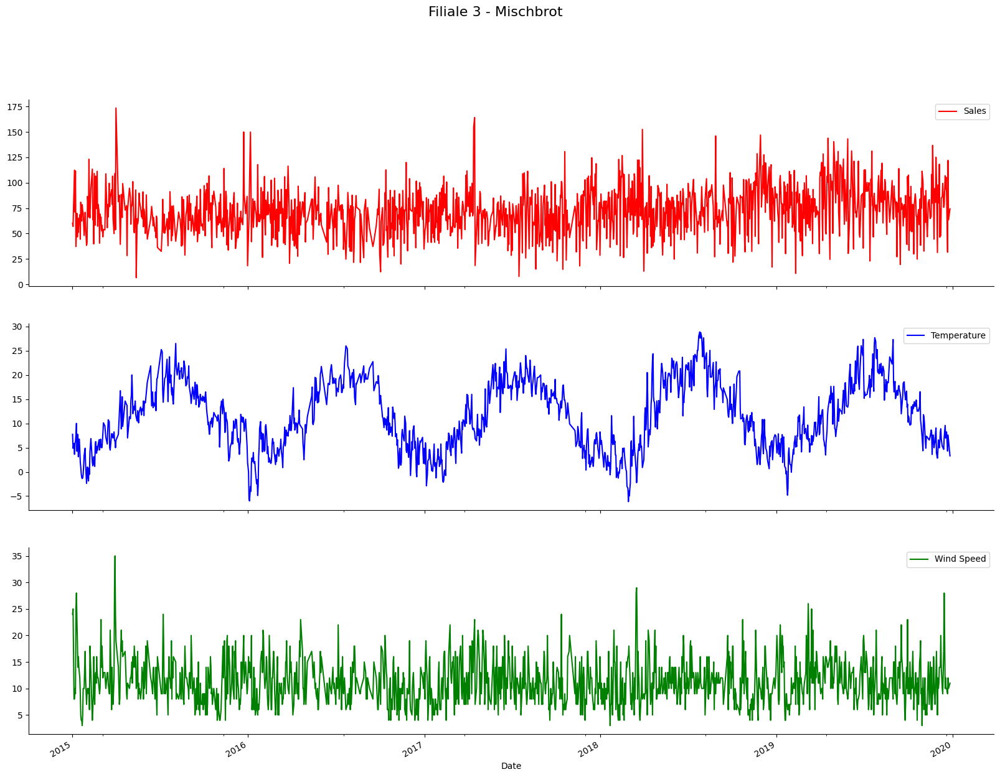

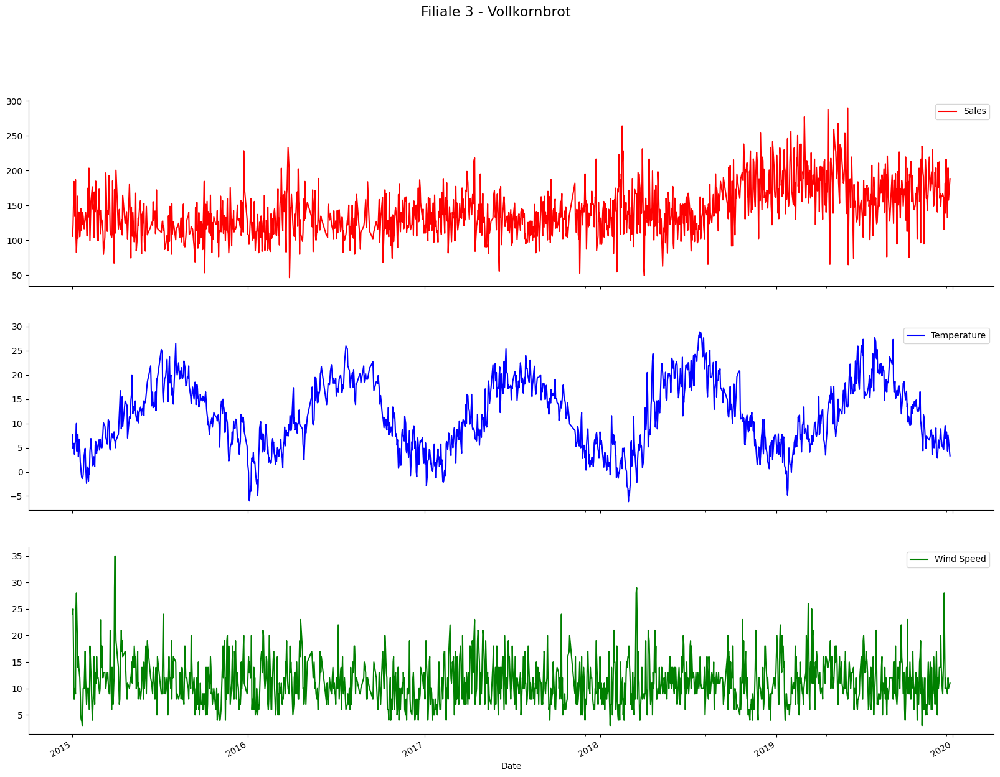

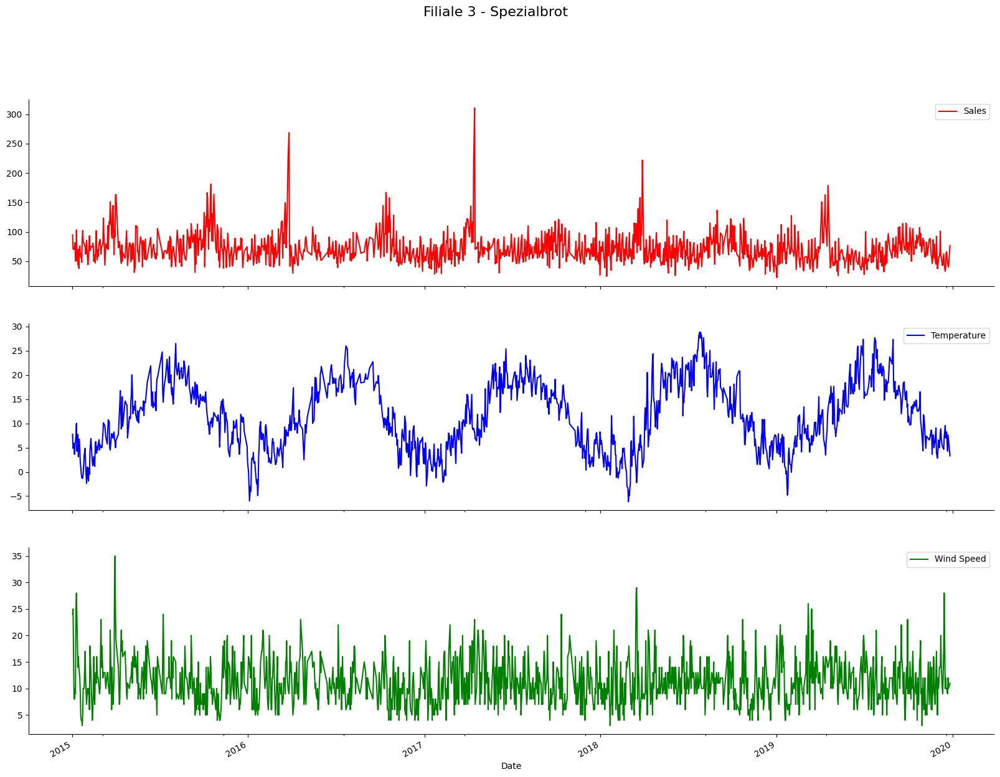

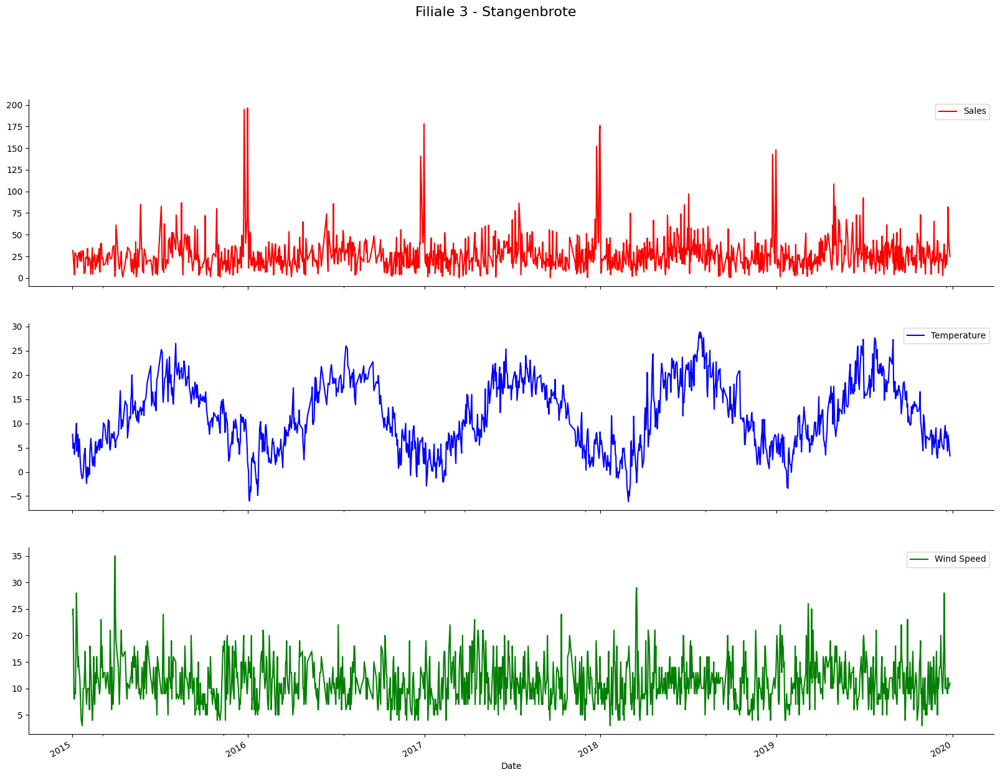

...

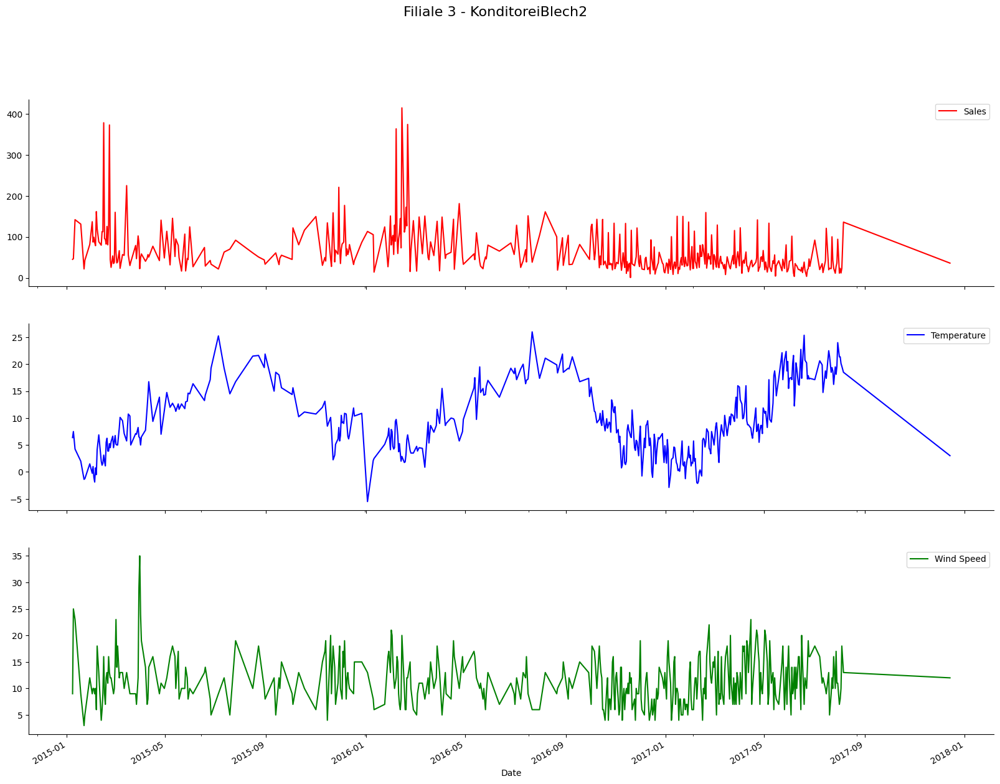

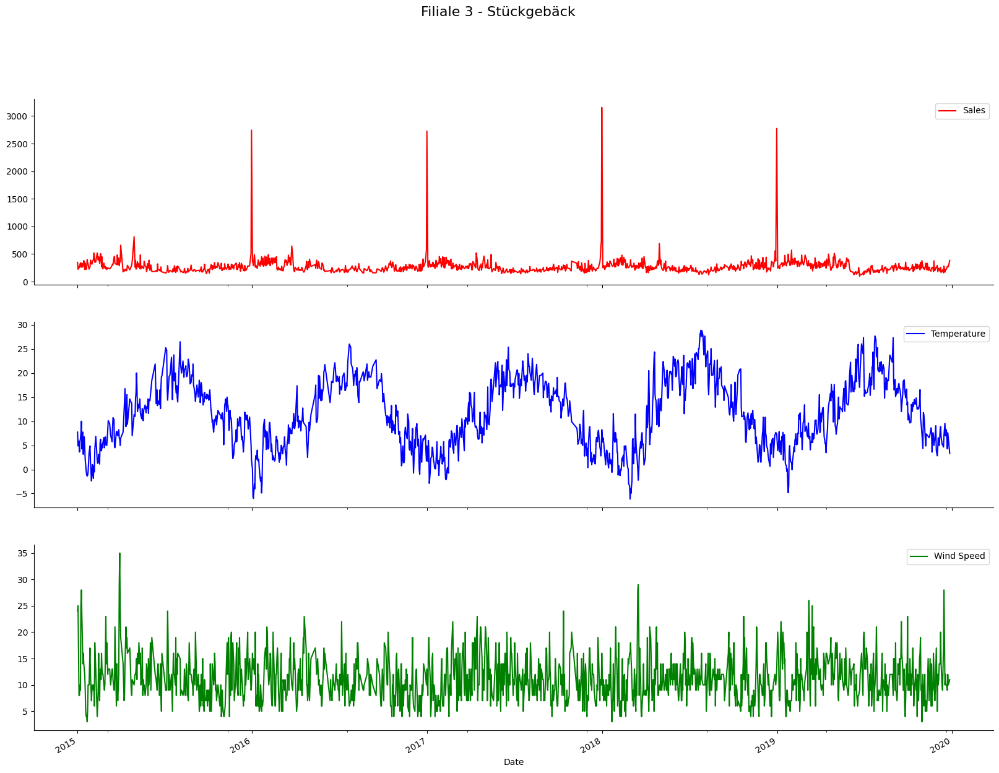

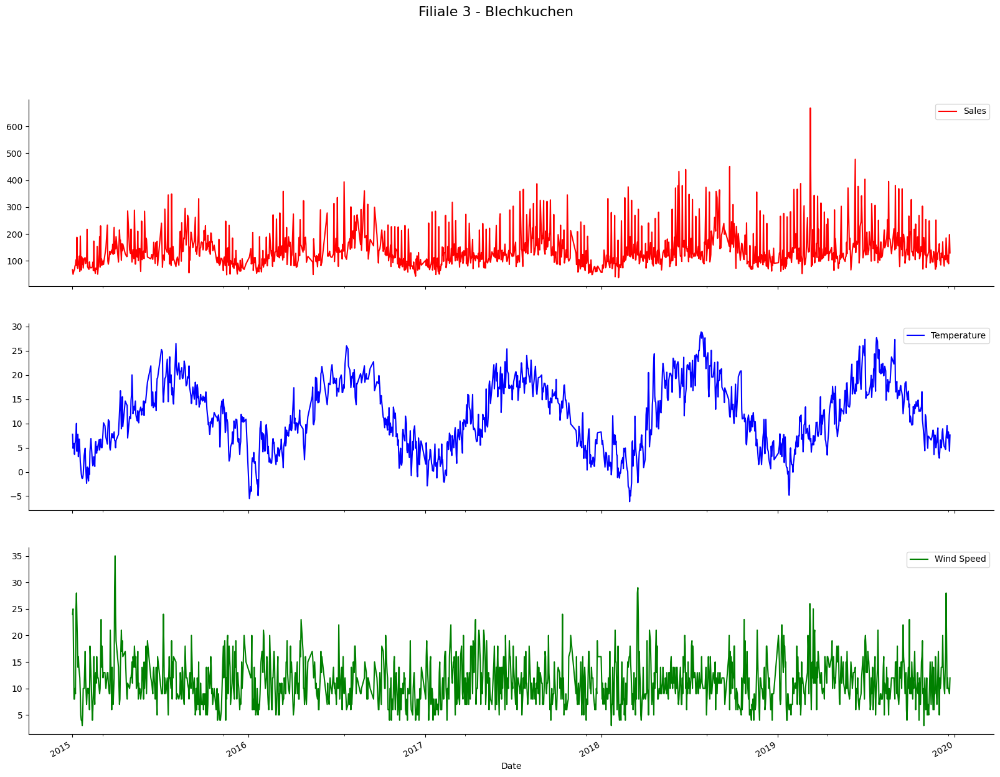

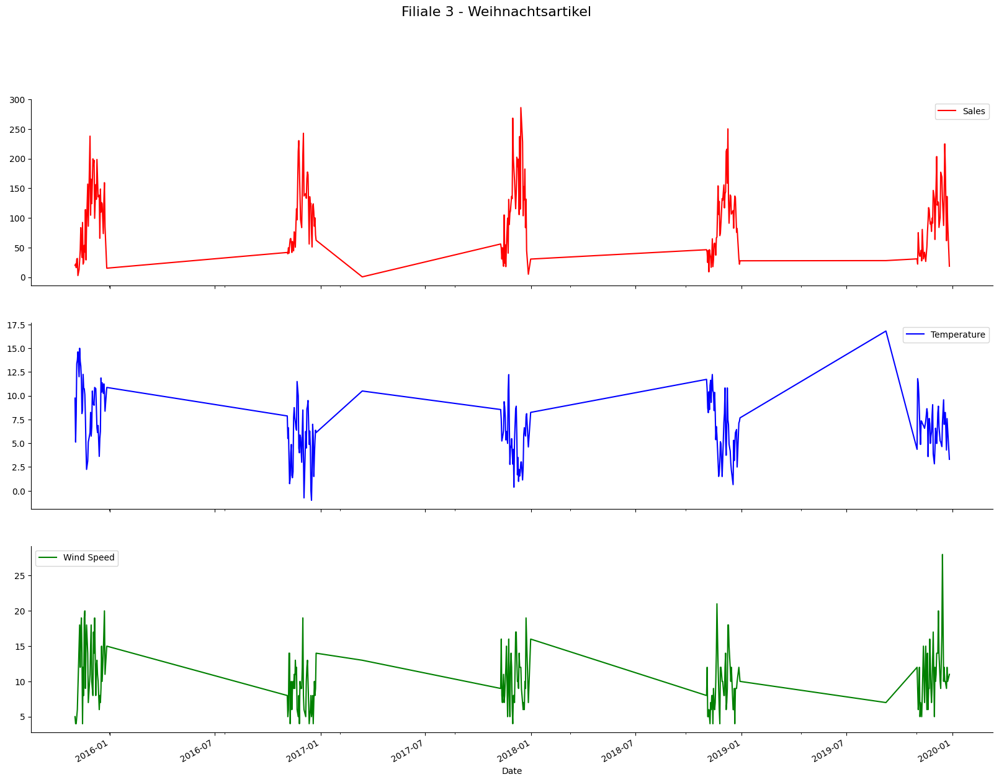

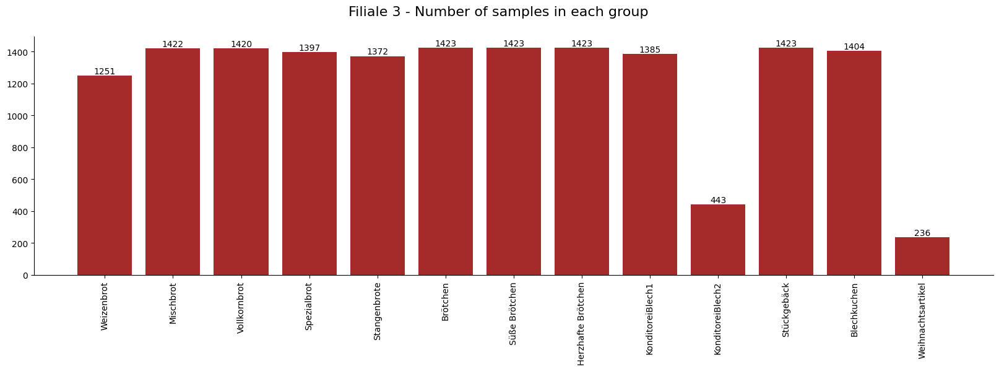

In [24]:
group_plot_df(filiale_3_df, 'Product Group', 'Filiale 3', label_dict, colors_list, product_group_dict)

## Possible Biases

[Investigate the dataset for any biases that could affect the model’s performance and fairness (e.g., class imbalance, historical biases).]


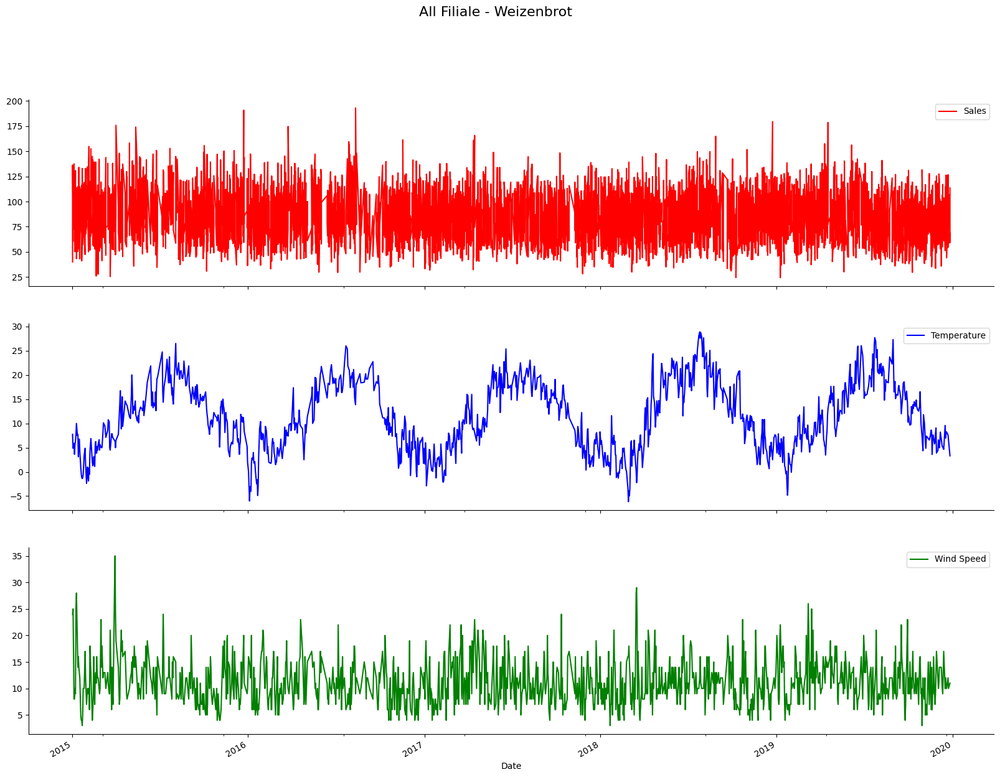

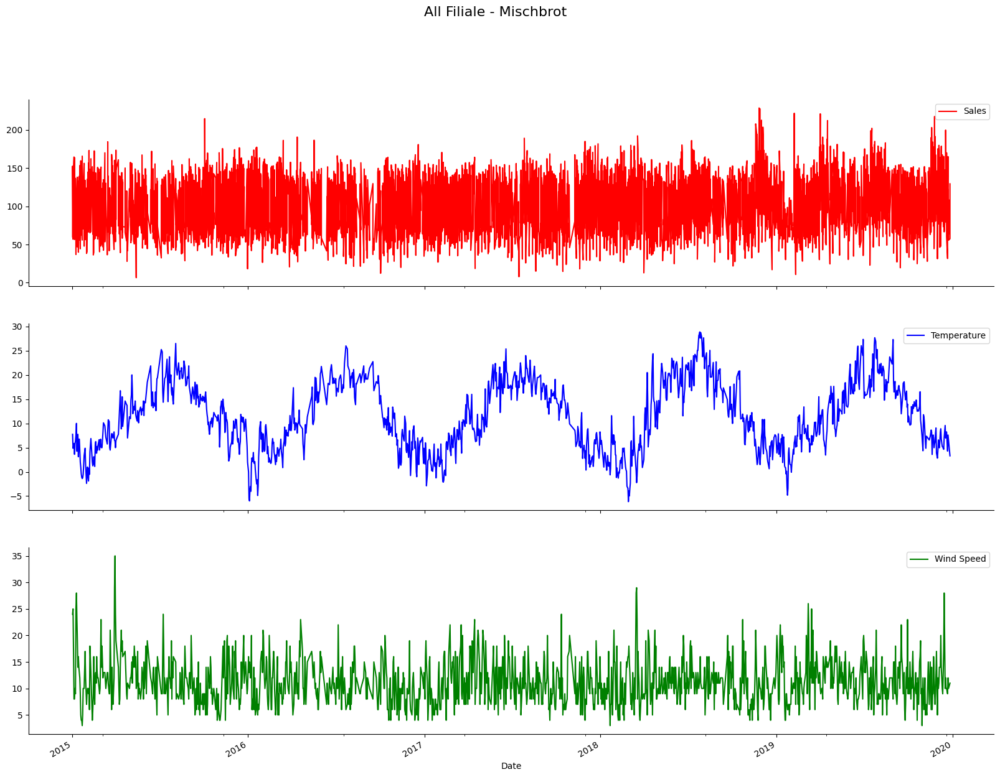

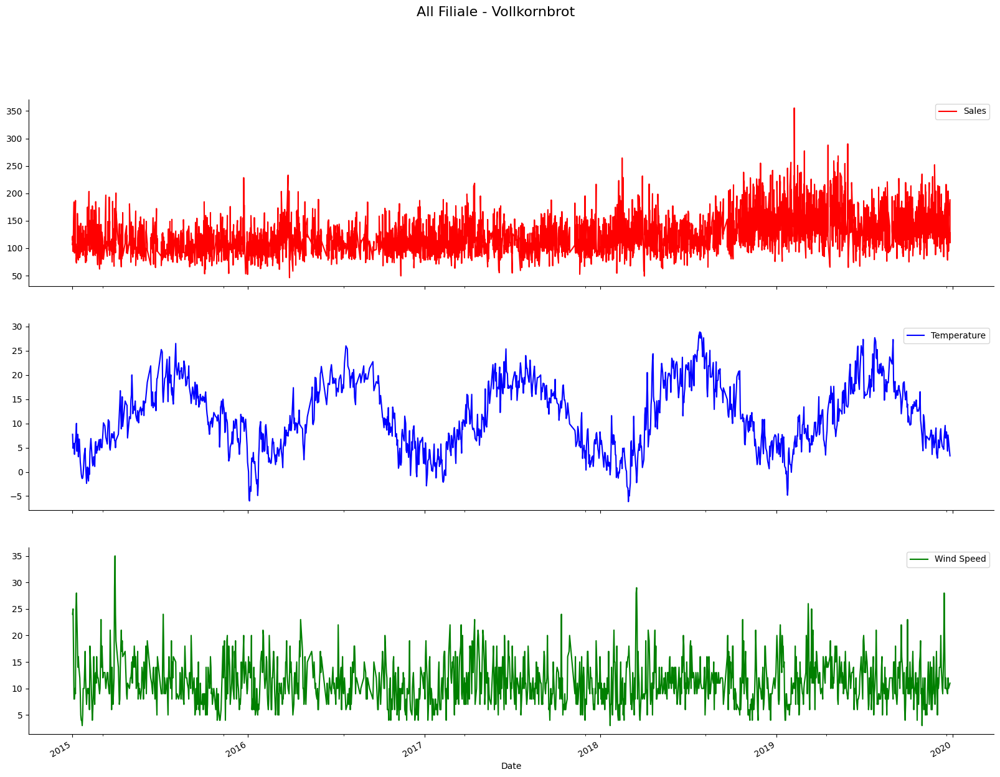

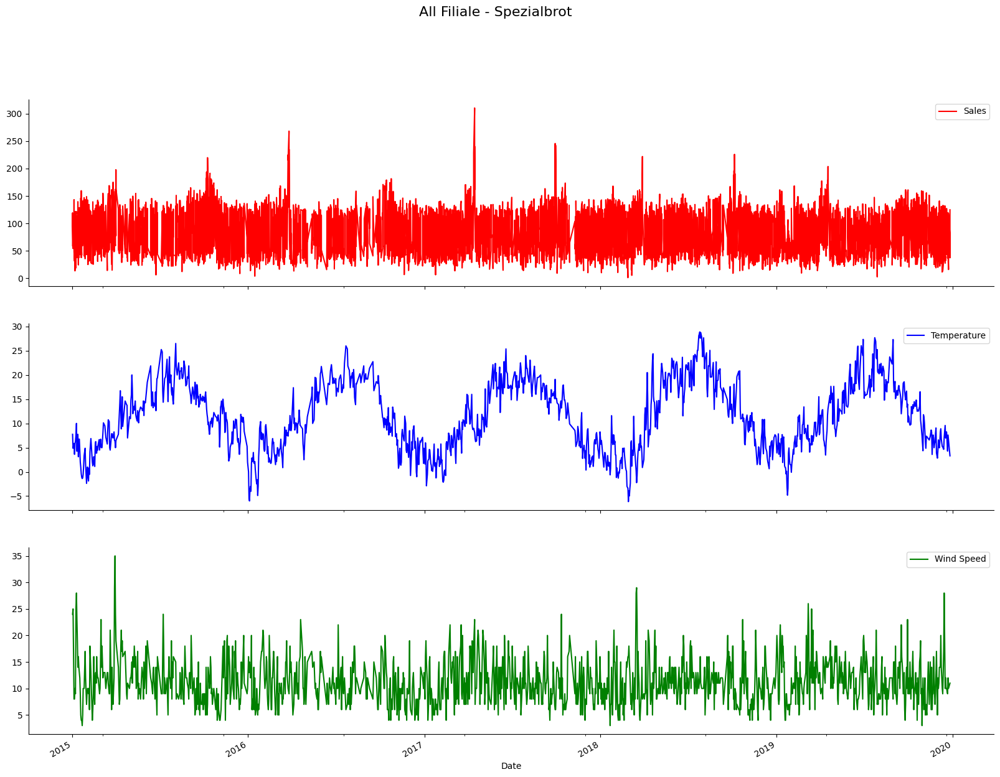

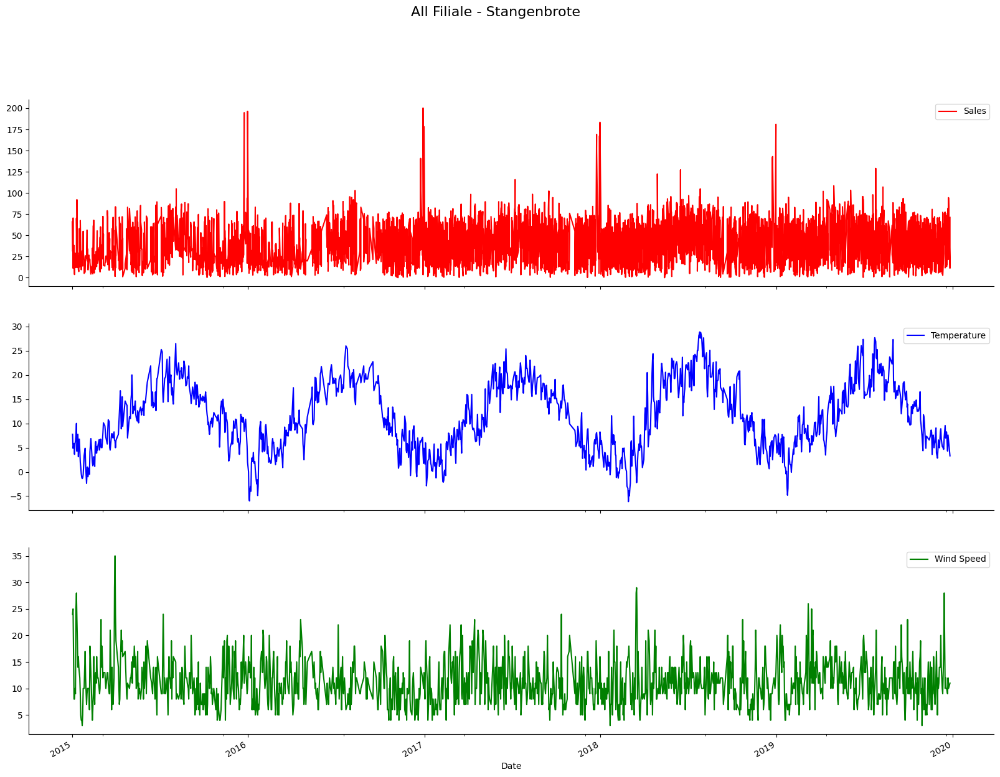

...

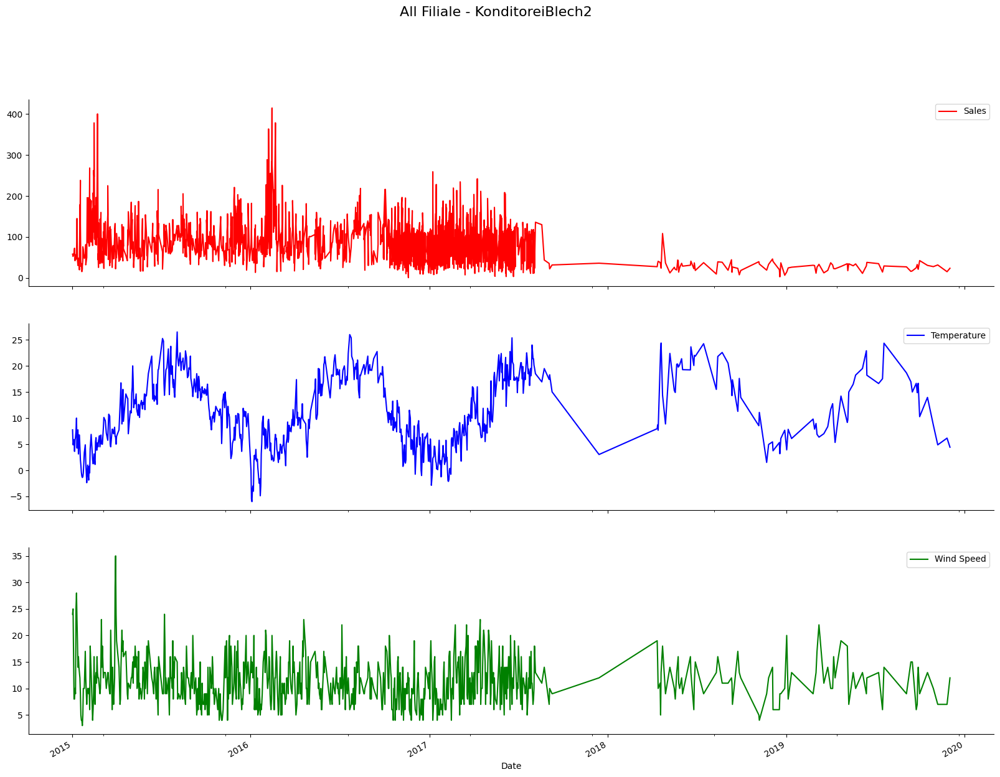

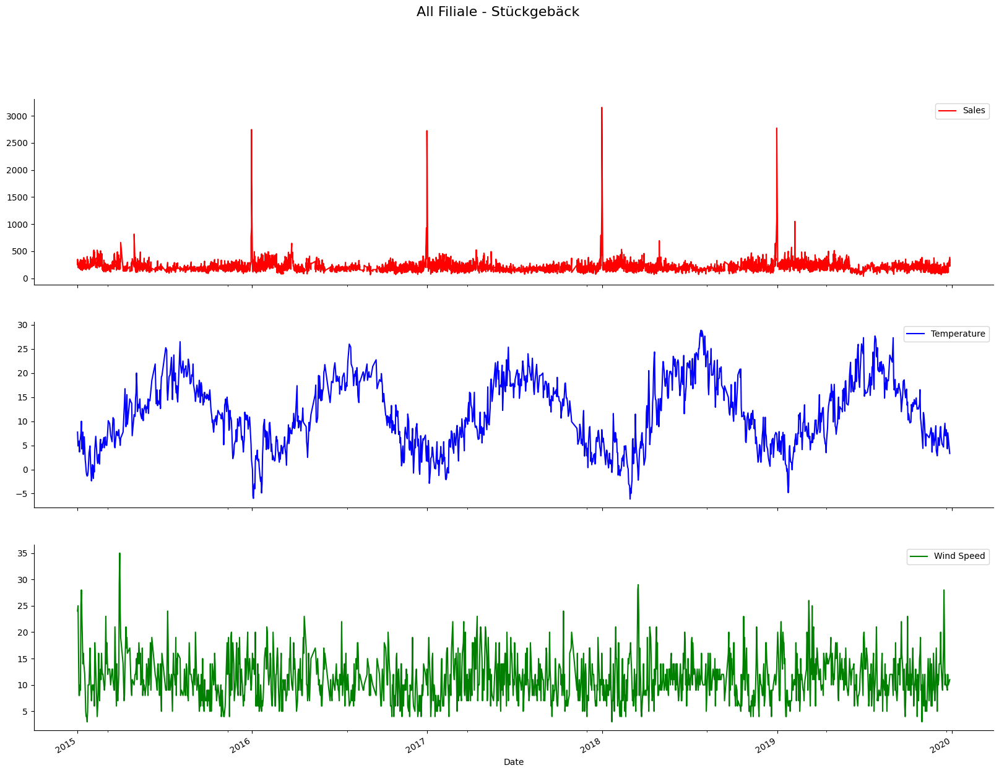

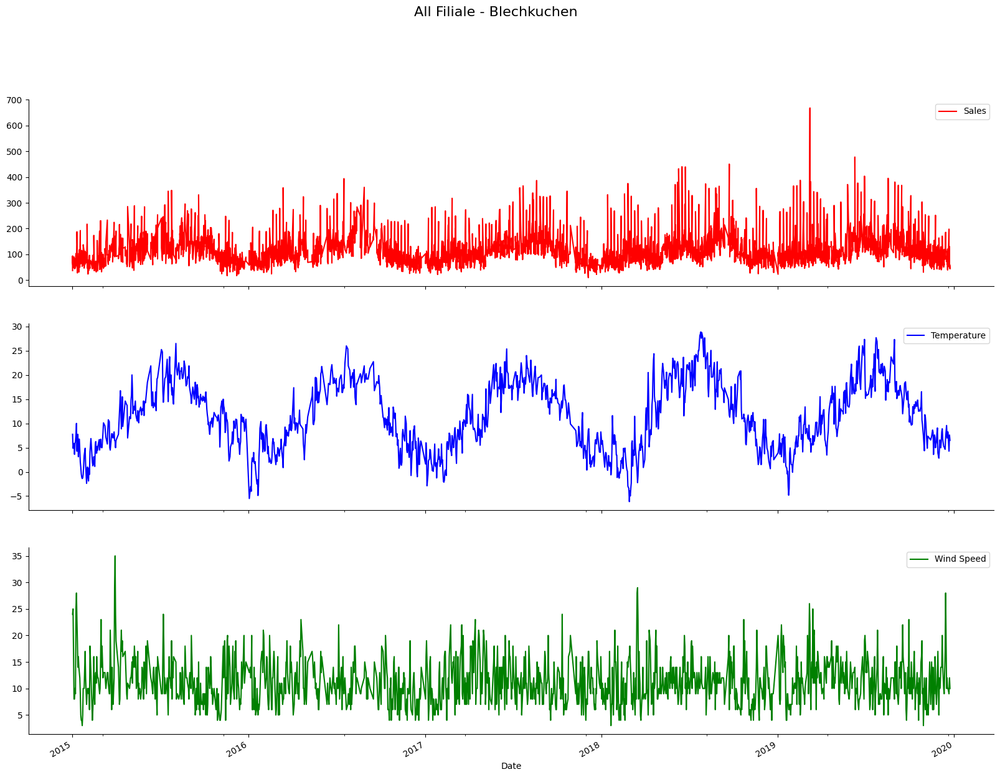

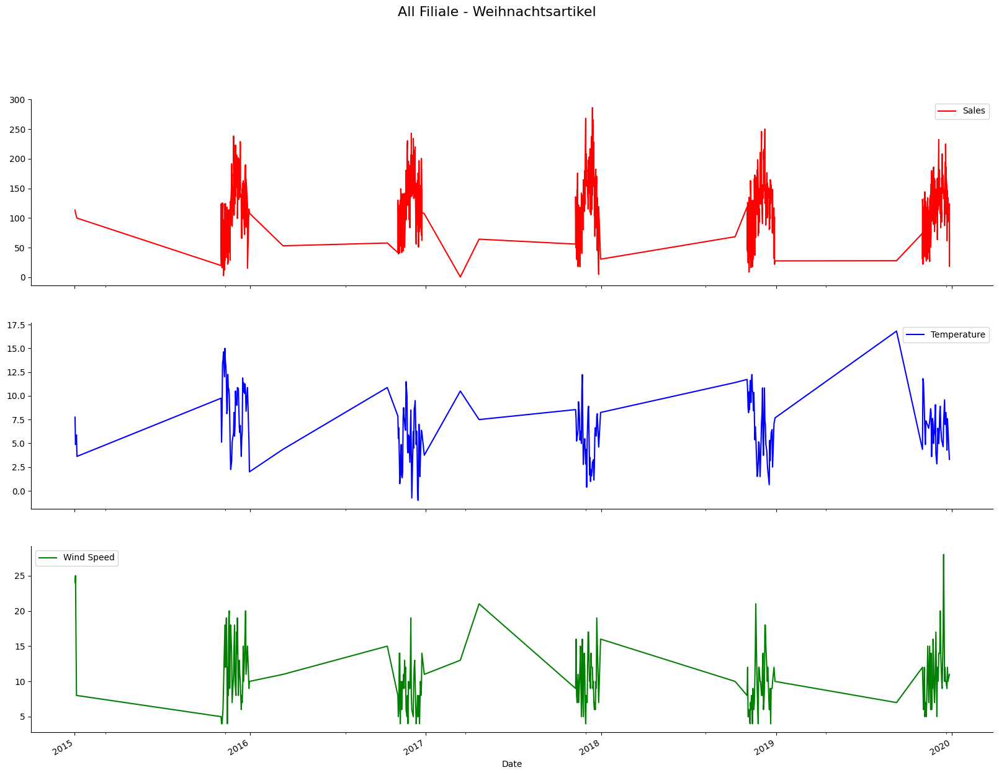

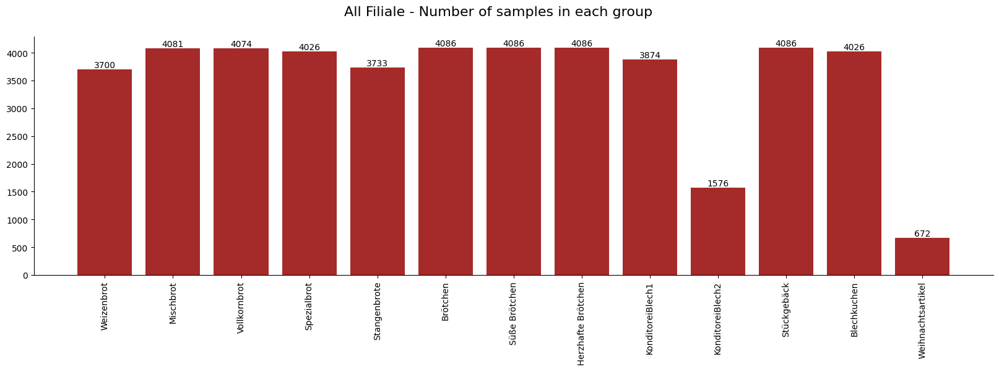

In [25]:
date_as_index_merged_df = merged_df.set_index("Date", inplace=False, drop=True) # set the date as 

group_plot_df(date_as_index_merged_df, 'Product Group', 'All Filiale', label_dict, colors_list, product_group_dict)


## Correlations

[Explore correlations between features and the target variable, as well as among features themselves.]


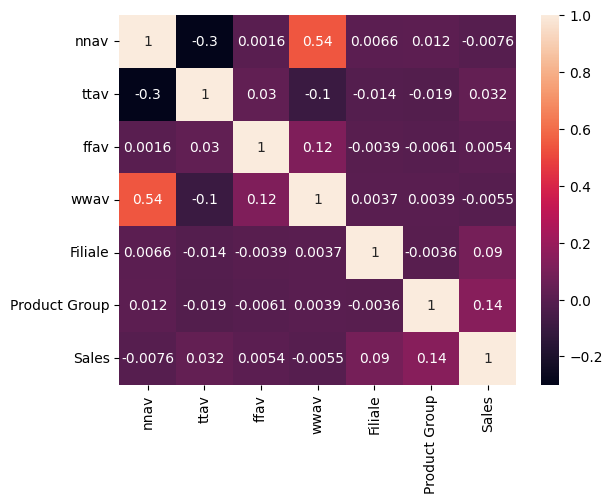

In [26]:
# Example: Plotting a heatmap to show feature correlations
correlation_matrix = date_as_index_merged_df.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()


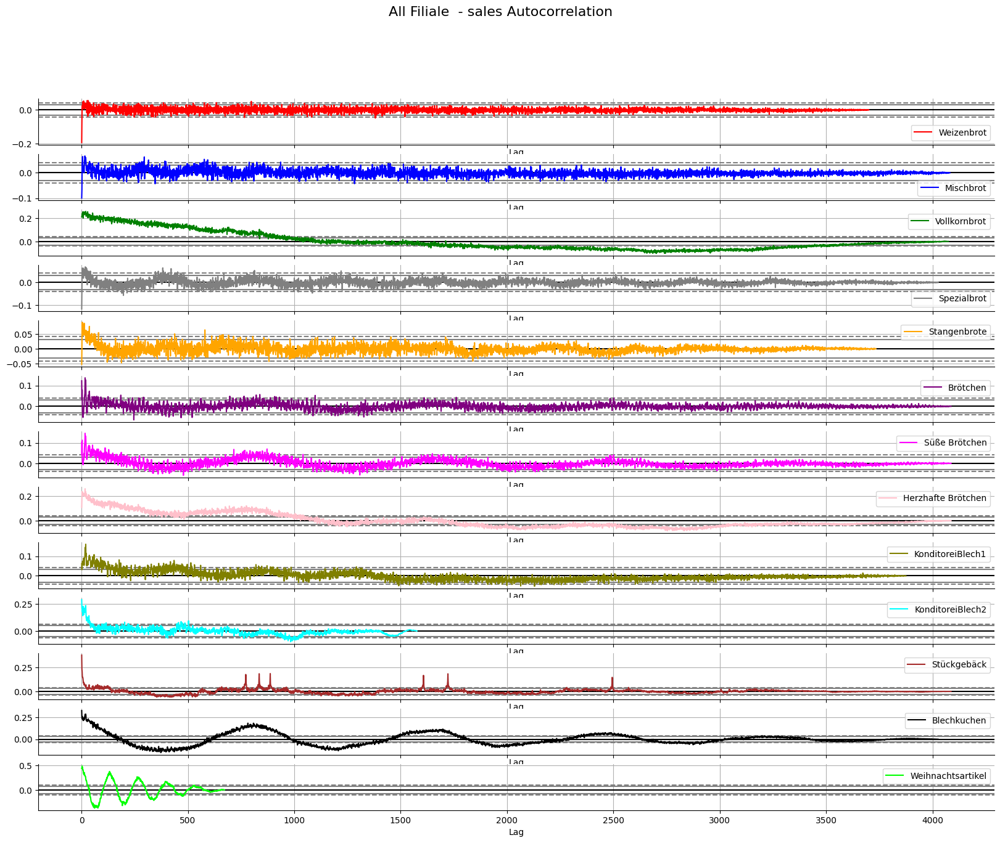

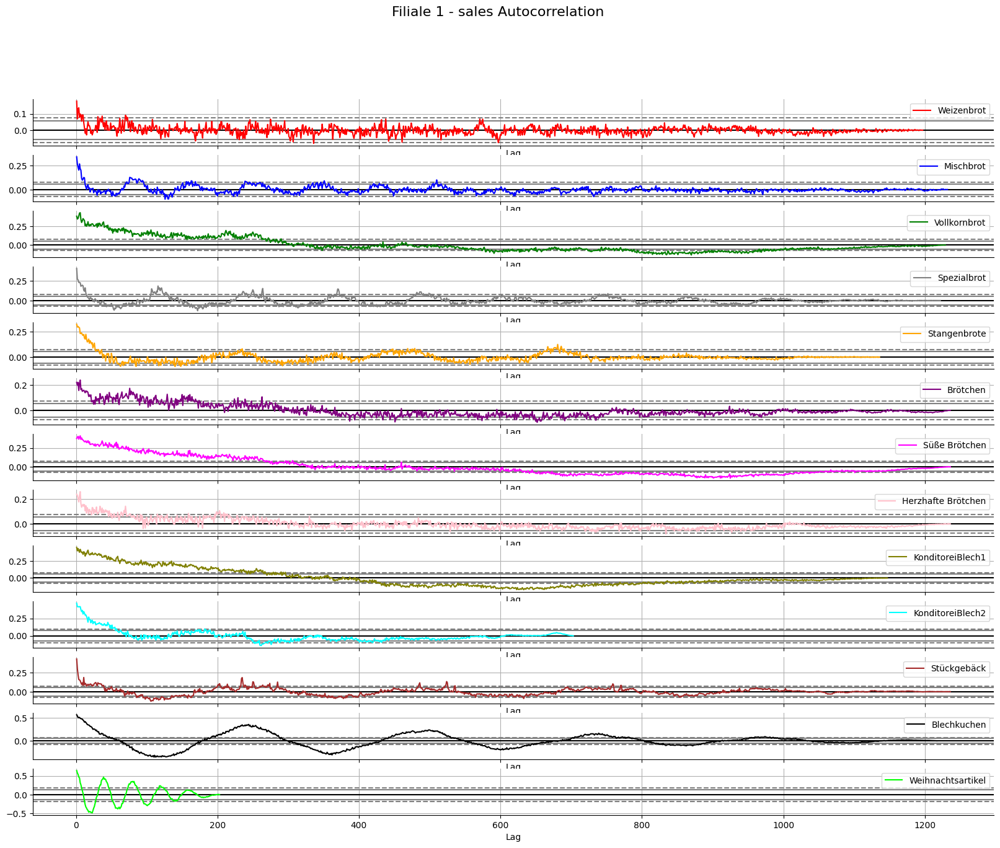

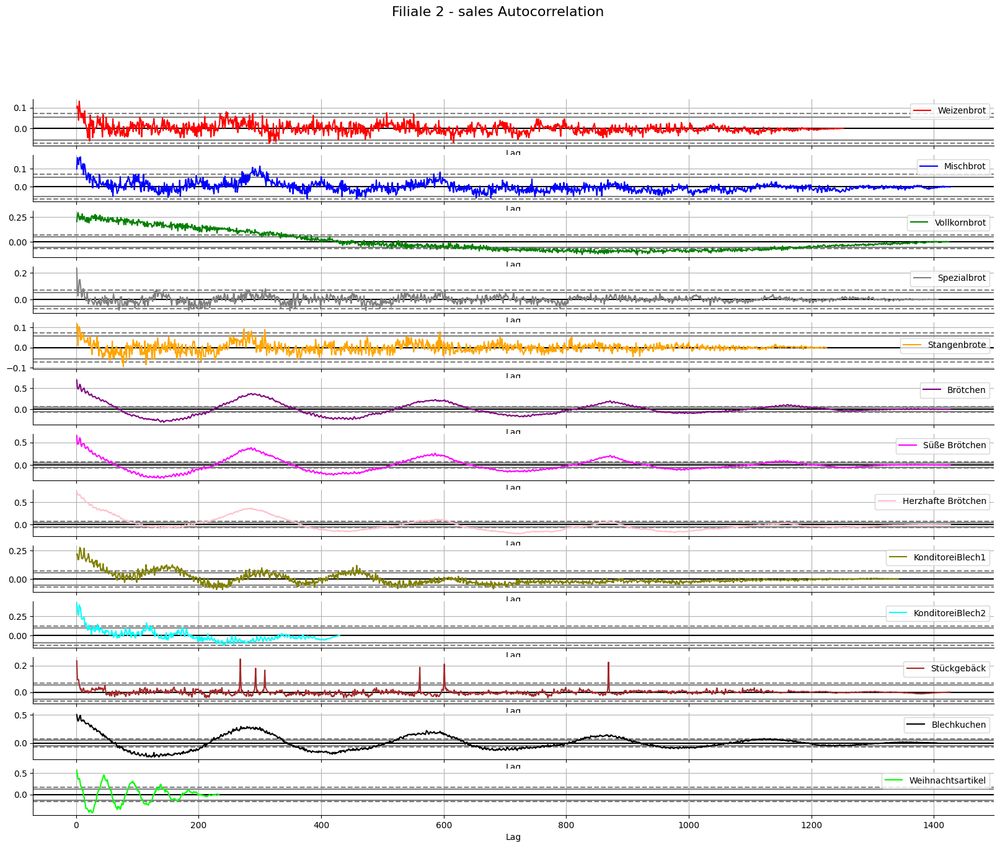

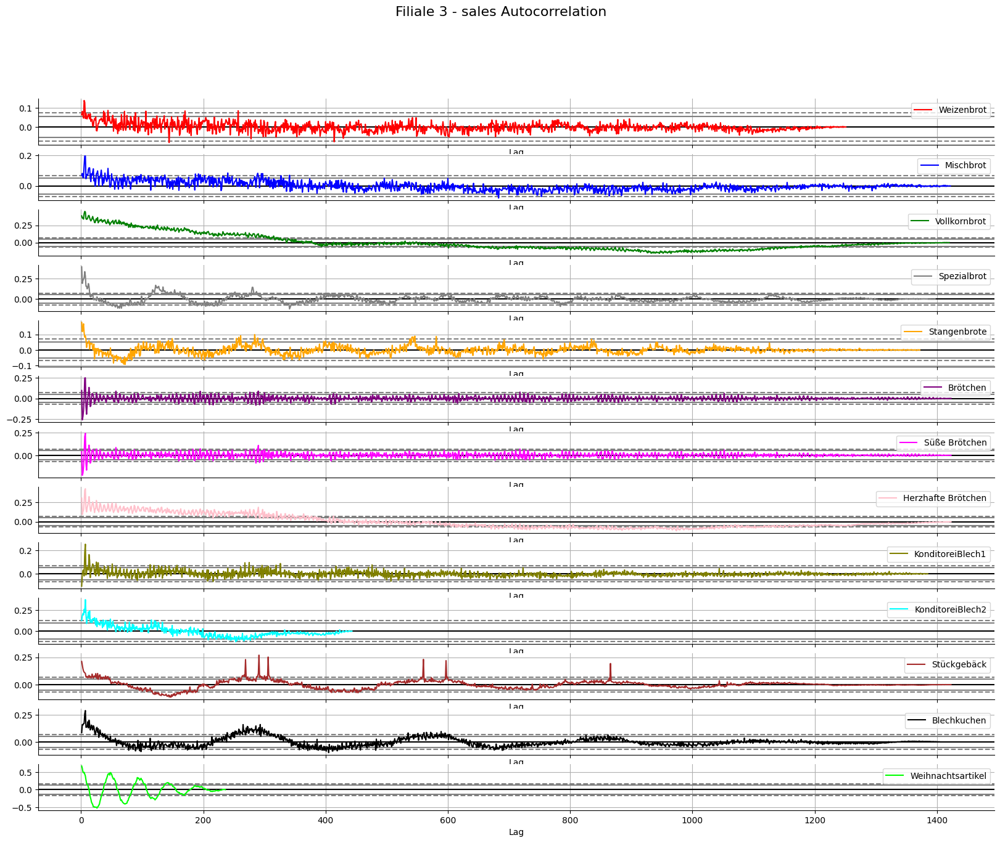

In [80]:
# time series correlation plot

def group_plot_corr_df(df, groupby, title, label_dict, colors_list, title_sufix_dict={}):
    """Plot a grouped dataframe"""
    
    # Group the dataframe
    grouped_df = df.groupby(groupby)

    
    fig, ax = plt.subplots(len(grouped_df), 1, figsize=(20,15), sharex=True)
    fig.suptitle(f"{title}", fontsize=16)
    # plot the sales for each product group
    for i, (name, group) in enumerate(grouped_df):
        group.sort_index(inplace=True)
        name = title_sufix_dict.get(name, name)
        
        autocorrelation_plot(group['Sales'], ax=ax[i], color=colors_list[i], label=name)        
        ax[i].set_ylabel('')
        for s in ['top', 'right']:
            try:
                ax[i].spines[s].set_visible(False)
            except:
                pass
    
                
    plt.show()
    
group_plot_corr_df(date_as_index_merged_df, 'Product Group', 'All Filiale  - sales Autocorrelation', label_dict, colors_list, product_group_dict)
group_plot_corr_df(filiale_1_df, 'Product Group', 'Filiale 1 - sales Autocorrelation', label_dict, colors_list, product_group_dict)
group_plot_corr_df(filiale_2_df, 'Product Group', 'Filiale 2 - sales Autocorrelation', label_dict, colors_list, product_group_dict)
group_plot_corr_df(filiale_3_df, 'Product Group', 'Filiale 3 - sales Autocorrelation', label_dict, colors_list, product_group_dict)

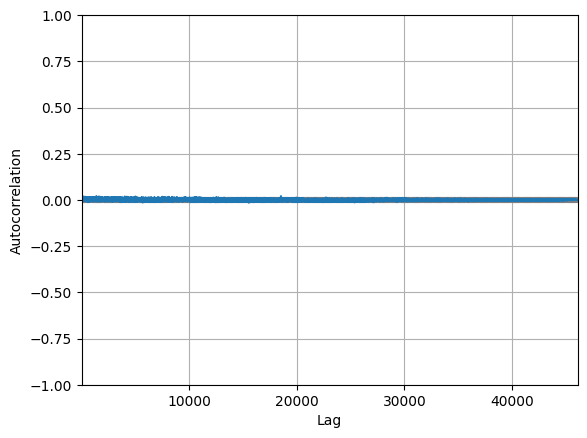

In [58]:
# plot autocorrelation
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(date_as_index_merged_df['Sales'])
plt.show()